# ***Train from scratch***

## **Model Architecture**
This is a custom convolutional neural network (CNN) built from scratch using pytorch with the following specifications:

**Layers**:

-  Conv2D: 3 → 32 channels (3×3 kernel, padding=1)

-  MaxPool2D (2×2)

-  Conv2D: 32 → 64 channels (3×3 kernel, padding=1)

-  MaxPool2D (2×2)

-  Fully Connected: 64 × 32 × 32 → 128 units

-  Output: 128 → 2 classes (binary classification)

**Key Specifications:**

-  Input size: 128×128 RGB images

-  Total parameters: ~3.4 million

-  Activation: ReLU

-  Loss: CrossEntropyLoss

-  Optimizer: Adam (lr=0.001)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Change path to your dataset
data_dir = '/content/drive/MyDrive/CV/data'

Mounted at /content/drive


In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torchvision
import os
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
  # Common image size
IMG_SIZE = 128

train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])  # scale between -1 and 1
])

val_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

In [ ]:
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "validation")

train_dataset = datasets.ImageFolder(root=train_dir, transform=train_transforms)
val_dataset = datasets.ImageFolder(root=val_dir, transform=val_transforms)

In [ ]:
BATCH_SIZE = 32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

Batch shape: torch.Size([32, 3, 128, 128])
Labels: tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 1])


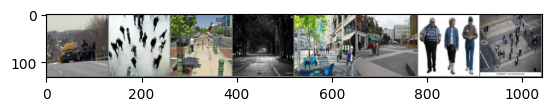

In [ ]:

# Get one batch
images, labels = next(iter(train_loader))

print("Batch shape:", images.shape)
print("Labels:", labels[:10])

# Show a few images
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

imshow(torchvision.utils.make_grid(images[:8]))

In [ ]:
from torch.utils.data import random_split

# How much of train data to use for validation (e.g. 20%)
val_ratio = 0.2
n_total = len(train_dataset)
n_val = int(n_total * val_ratio)
n_train = n_total - n_val

train_dataset, val_dataset = random_split(train_dataset, [n_train, n_val])

print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")

Train samples: 1010
Validation samples: 252


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class PedestrianCNN(nn.Module):
    def __init__(self):
        super(PedestrianCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(64 * (IMG_SIZE//4) * (IMG_SIZE//4), 128)  # after 2 pools
        self.fc2 = nn.Linear(128, 2)  # binary classification

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)  # flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = PedestrianCNN().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=10):
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0, 0, 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_acc = 100 * correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_acc = 100 * val_correct / val_total

        print(f"Epoch [{epoch+1}/{epochs}] "
              f"Train Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.2f}% "
              f"Val Loss: {val_loss/len(val_loader):.4f}, Val Acc: {val_acc:.2f}%")

In [ ]:
train_model(model, train_loader, val_loader, criterion, optimizer, epochs=10)

Epoch [1/10] Train Loss: 0.6833, Train Acc: 64.36% Val Loss: 0.5232, Val Acc: 74.60%
Epoch [2/10] Train Loss: 0.4996, Train Acc: 74.55% Val Loss: 0.4353, Val Acc: 79.37%
Epoch [3/10] Train Loss: 0.4126, Train Acc: 80.69% Val Loss: 0.4031, Val Acc: 82.14%
Epoch [4/10] Train Loss: 0.3257, Train Acc: 85.74% Val Loss: 0.3696, Val Acc: 84.13%
Epoch [5/10] Train Loss: 0.2601, Train Acc: 89.50% Val Loss: 0.3580, Val Acc: 85.32%
Epoch [6/10] Train Loss: 0.2041, Train Acc: 92.77% Val Loss: 0.4144, Val Acc: 80.56%
Epoch [7/10] Train Loss: 0.1860, Train Acc: 93.27% Val Loss: 0.4444, Val Acc: 80.56%
Epoch [8/10] Train Loss: 0.1117, Train Acc: 95.45% Val Loss: 0.4017, Val Acc: 83.73%
Epoch [9/10] Train Loss: 0.0834, Train Acc: 97.33% Val Loss: 0.5567, Val Acc: 78.97%
Epoch [10/10] Train Loss: 0.0471, Train Acc: 98.71% Val Loss: 0.5314, Val Acc: 82.54%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

def evaluate_model(model, val_loader, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

class_names = train_dataset.dataset.classes if hasattr(train_dataset, "dataset") else train_dataset.classes
y_pred, y_true = evaluate_model(model, val_loader, class_names)

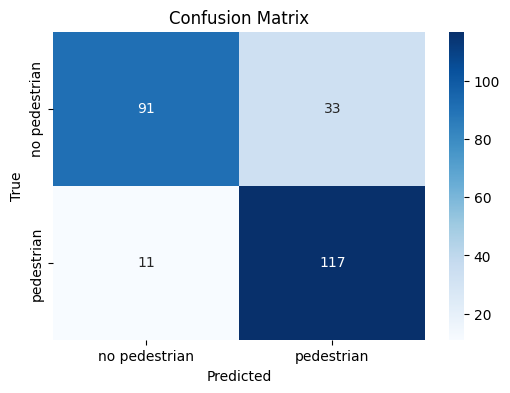


Classification Report:

               precision    recall  f1-score   support

no pedestrian       0.89      0.73      0.81       124
   pedestrian       0.78      0.91      0.84       128

     accuracy                           0.83       252
    macro avg       0.84      0.82      0.82       252
 weighted avg       0.84      0.83      0.82       252



In [ ]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

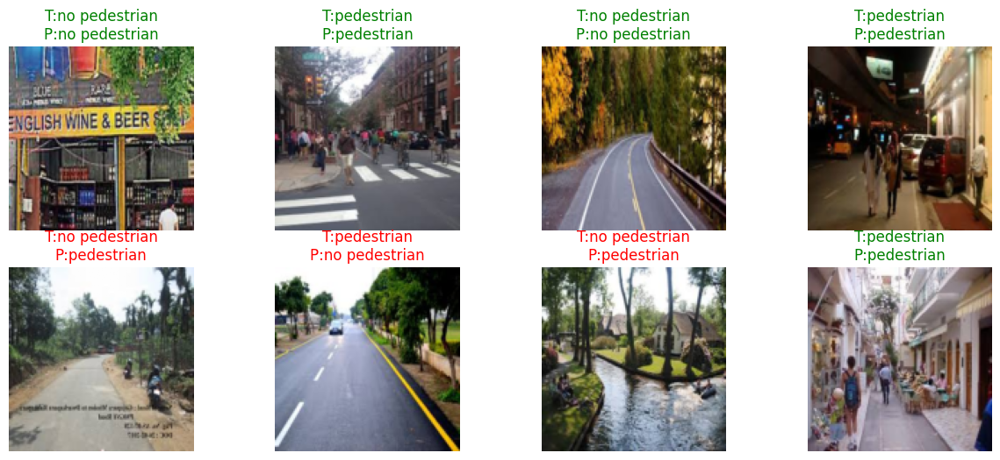

In [ ]:
def show_predictions(model, val_loader, class_names, num_samples=8):
    model.eval()
    shown = 0
    plt.figure(figsize=(15, 6))

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            for i in range(len(labels)):
                if shown >= num_samples:
                    return
                correct = preds[i] == labels[i]
                plt.subplot(2, num_samples//2, shown+1)
                img = images[i].cpu().numpy()
                img = np.transpose(img, (1,2,0))
                img = (img * 0.5 + 0.5)  # unnormalize
                plt.imshow(img)
                plt.title(f"T:{class_names[labels[i]]}\nP:{class_names[preds[i]]}",
                          color="green" if correct else "red")
                plt.axis("off")
                shown += 1

show_predictions(model, val_loader, class_names, num_samples=8)


## **Performance Limitations**

1. **Limited Feature Representation:** This from scratch model only learns basic features from limited data, lacking the sophisticated hierarchical feature extraction of deeper models.

2. **Architectural Disadvantages**: With only two convolutional layers and no advanced components like residual connections, the shallow network struggles to learn complex patterns effectively to achieve good accuracy.

3. **Training Efficiency**: Training from random initialization requires more data and epochs to converge compared to leveraging pre-trained feature extractors. As such, even though it takes a longer amount of time to train, it fails to perform up to the standards of pre-trained resnet models

# ***VGG16***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score

In [ ]:
# DATASET PATH
data_dir = '/content/drive/MyDrive/Colab Notebooks/SIT/CV/data'
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "validation")

IMG_SIZE = 128
BATCH_SIZE = 32

In [ ]:
# AUGMENTATION & IMAGENET NORMALIZATION
# Resize all images to 128x128 pixels
# Augment data by flipping random images horizontally
# Convert images to PyTorch tensors and normalize pixel values
train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(root=train_dir, transform=train_transforms)
val_dataset = datasets.ImageFolder(root=val_dir, transform=val_transforms)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [ ]:
# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [ ]:
# Training function
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=10):
    for epoch in range(epochs):
        model.train()
        running_loss, running_correct, total = 0, 0, 0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.float().unsqueeze(1).to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            preds = torch.sigmoid(outputs).round()
            running_correct += (preds == labels).sum().item()
            total += labels.size(0)
        train_acc = 100 * running_correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0
        val_probs, val_targets = [], []
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.float().unsqueeze(1).to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                probs = torch.sigmoid(outputs)
                preds = probs.round()
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)
                val_probs += probs.cpu().numpy().flatten().tolist()
                val_targets += labels.cpu().numpy().flatten().tolist()
        val_acc = 100 * val_correct / val_total
        try:
            val_auc = roc_auc_score(val_targets, val_probs)
        except:
            val_auc = 'N/A'
        print(f"Epoch [{epoch+1}/{epochs}] "
              f"Train Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.2f}% "
              f"Val Loss: {val_loss/len(val_loader):.4f}, Val Acc: {val_acc:.2f}%, Val ROC AUC: {val_auc}")
        scheduler.step()

In [ ]:
def evaluate_model(model, loader):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.float().unsqueeze(1).to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs)
            preds = probs.round()
            all_preds.extend(preds.cpu().numpy().flatten().tolist())
            all_labels.extend(labels.cpu().numpy().flatten().tolist())
    return np.array(all_preds), np.array(all_labels)

In [ ]:
# show_predictions function
def show_predictions(model, loader, class_names, num_samples=8):
    model.eval()
    shown = 0
    plt.figure(figsize=(15, 6))
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.cpu().numpy()
            outputs = model(images)
            probs = torch.sigmoid(outputs)
            preds = probs.round().cpu().numpy().flatten()
            for i in range(len(labels)):
                if shown >= num_samples:
                    return
                correct = preds[i] == labels[i]
                plt.subplot(2, num_samples//2, shown+1)
                img = images[i].cpu().numpy()
                img = np.transpose(img, (1,2,0))
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # unnormalize
                img = np.clip(img, 0, 1)
                plt.imshow(img)
                plt.title(f"T:{class_names[int(labels[i])]} | P:{class_names[int(preds[i])]}",
                          color="green" if correct else "red")
                plt.axis("off")
                shown += 1

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader
import os

# MODEL: PRETRAINED VGG16
model_vgg = models.vgg16(weights='IMAGENET1K_V1')

# Freeze all layers except classifier to prevent their weights from being updated during training
for param in model_vgg.parameters():
    param.requires_grad = False

# Modify for binary classification
num_ftrs = model_vgg.classifier[6].in_features
model_vgg.classifier[6] = nn.Linear(num_ftrs, 1) # Binary classification

model_vgg = model_vgg.to(device)

# LOSS, OPTIMIZER, LR SCHEDULER
criterion_vgg = nn.BCEWithLogitsLoss()
optimizer_vgg = optim.Adam(model_vgg.classifier.parameters(), lr=0.001)
scheduler_vgg = optim.lr_scheduler.StepLR(optimizer_vgg, step_size=5, gamma=0.1)

# TRAINING LOOP
print("Training VGG16 model...")
train_model(model_vgg, train_loader, val_loader, criterion_vgg, optimizer_vgg, scheduler_vgg, epochs=10)

Training VGG16 model...
Epoch [1/10] Train Loss: 0.4050, Train Acc: 80.74% Val Loss: 0.3107, Val Acc: 88.42%, Val ROC AUC: 0.9473650611254748
Epoch [2/10] Train Loss: 0.2653, Train Acc: 88.03% Val Loss: 0.3788, Val Acc: 86.16%, Val ROC AUC: 0.9470139487375914
Epoch [3/10] Train Loss: 0.2692, Train Acc: 88.43% Val Loss: 0.3574, Val Acc: 87.57%, Val ROC AUC: 0.9485141562130933
Epoch [4/10] Train Loss: 0.2557, Train Acc: 89.46% Val Loss: 0.3252, Val Acc: 87.57%, Val ROC AUC: 0.9530466979475885
Epoch [5/10] Train Loss: 0.2432, Train Acc: 89.22% Val Loss: 0.3798, Val Acc: 87.57%, Val ROC AUC: 0.953557406875419
Epoch [6/10] Train Loss: 0.2300, Train Acc: 90.25% Val Loss: 0.3519, Val Acc: 89.27%, Val ROC AUC: 0.9543234702671647
Epoch [7/10] Train Loss: 0.2373, Train Acc: 90.10% Val Loss: 0.3683, Val Acc: 87.85%, Val ROC AUC: 0.9536212454913977
Epoch [8/10] Train Loss: 0.2372, Train Acc: 90.57% Val Loss: 0.3720, Val Acc: 87.57%, Val ROC AUC: 0.9534935682594401
Epoch [9/10] Train Loss: 0.2229, 


Evaluating VGG16 model...

Classification Report (VGG16):

               precision    recall  f1-score   support

no pedestrian       0.83      0.94      0.88       177
   pedestrian       0.93      0.80      0.86       177

     accuracy                           0.87       354
    macro avg       0.88      0.87      0.87       354
 weighted avg       0.88      0.87      0.87       354



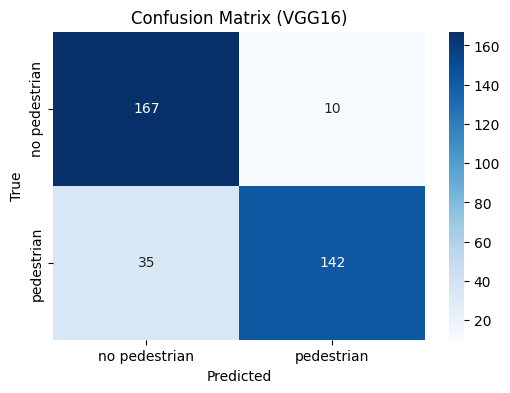

In [ ]:
# EVALUATE & CONFUSION MATRIX FOR VGG16
import seaborn as sns
print("\nEvaluating VGG16 model...")
y_pred_vgg, y_true_vgg = evaluate_model(model_vgg, val_loader)

print("\nClassification Report (VGG16):\n")
print(classification_report(y_true_vgg, y_pred_vgg, target_names=train_dataset.classes))

cm_vgg = confusion_matrix(y_true_vgg, y_pred_vgg)
plt.figure(figsize=(6,4))
sns.heatmap(cm_vgg, annot=True, fmt="d", cmap="Blues",
            xticklabels=train_dataset.classes, yticklabels=train_dataset.classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (VGG16)")
plt.show()


Showing VGG16 predictions...


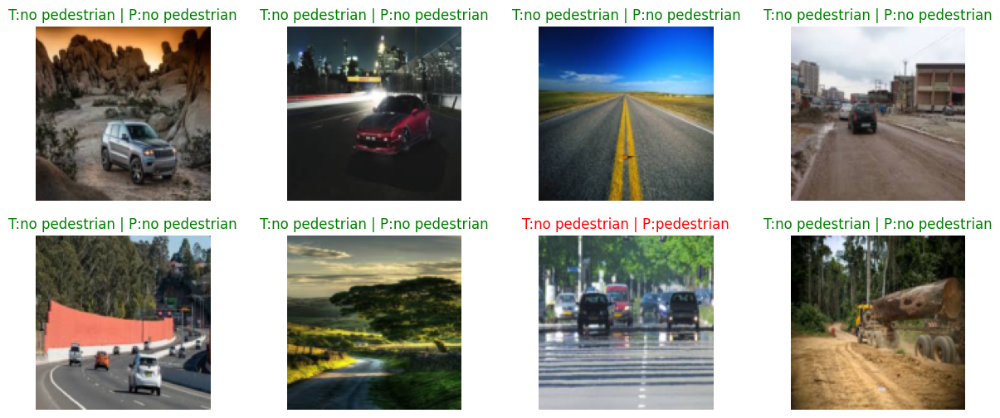

In [ ]:
# Show predictions for VGG16
# T is the actual class of image and P is the model Prediction
print("\nShowing VGG16 predictions...")
show_predictions(model_vgg, val_loader, train_dataset.classes, num_samples=8)

**VGG16 Analysis and Results:**

For VGG16, I used a pre trained model and only trained the final classification layer to adapt it for the two classes "no pedestrian" and "pedestrian". The results showed a validation accuracy 87%, with good precision and recall for both classes. The testing also showed that the model learned to effectively differentiate for the majority of the images.

# ***Resnet 18***


Data Prep:


* Fix any spelling errors and make sure labels are consistent to be exactly "no pedestrian" or "pedestrian" (lowercases, trims, fixes “pedestrain” typo) using normalize_label()

* Tolerates folder/name mismatches by checking alias subfolders, then doing a recursive search if needed using find_image_path()

* Transforms by:
    * Using resize((224, 224)) to fit the ResNet18 model

    * RandomHorizontalFlip and RandomRotation(10) only on the training dataset to improve generalization by helping the model learn to recognize pedestrians in different positions
        * Reason for not using on validation dataset: Same image might look different each time the model evaluate, so the validation accuracy would be inconsistent and validation dataset should represent real and untouched data

    * ToTensor() transform converts images from their normal picture format into numerical tensors (arrays of numbers) that PyTorch models can understand. This allows the model to process the image mathematically and learn visual patterns during training

    * ImageNet normalization to normalize brightness and color levels by adjusting the image colors so that they look statistically similar to the dataset the base model ResNet18 was originally trained on

* Using DataLoader to:
    * Load the data in mini-batches (size 32)
    * Shuffle the training data (for better learning)
    * Prepare the images and labels to be sent to the GPU

Base Model: ResNet-18 from torchvision as it is a well-known convolutional neural network (CNN) architecture that has already been trained on ImageNet

* The pretrained weights help the model “start smart” - Default was chosen

Modelling:

* Replace the final fully-connected layer with nn.Linear(in_features, 2) to output logits for the two classes as it helps to:

    * Keep the pretrained layers (for general image understanding)

    * Replace & train the last layer (to specialize on pedestrian detection)

* Criterion: nn.CrossEntropyLoss() which is suitable for 2 classes

* Optimiser: AdamW(lr=1e-4, weight_decay=1e-4) updates the model’s weights after each training step so it makes fewer mistakes. It uses a small learning rate for gentle fine-tuning and applies weight decay to stop the model from memorizing the training data too much and cause overfitting

Modelling Training:
* Training runs for 8 epochs with each epochs:
    1. Model sees a batch of images
    2. It predicts whether each has a pedestrian or not
    3. The loss is calculated
    4. The optimizer updates the weights
    5. Accuracy and loss are tracked for both train and validation sets
    6. If the validation accuracy improves, the model is saved (checkpointed)

* To prevent the pretrained model from overfitting over time, I used a checkpoint method that saves the best-performing model based on validation accuracy. This ensures that the most accurate version of the model is kept, instead of only relying on the final trained model

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip show torch torchvision torchaudio

Name: torch
Version: 2.8.0+cu126
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3-Clause
Location: /usr/local/lib/python3.12/dist-packages
Requires: filelock, fsspec, jinja2, networkx, nvidia-cublas-cu12, nvidia-cuda-cupti-cu12, nvidia-cuda-nvrtc-cu12, nvidia-cuda-runtime-cu12, nvidia-cudnn-cu12, nvidia-cufft-cu12, nvidia-cufile-cu12, nvidia-curand-cu12, nvidia-cusolver-cu12, nvidia-cusparse-cu12, nvidia-cusparselt-cu12, nvidia-nccl-cu12, nvidia-nvjitlink-cu12, nvidia-nvtx-cu12, setuptools, sympy, triton, typing-extensions
Required-by: accelerate, fastai, peft, sentence-transformers, timm, torchaudio, torchdata, torchvision
---
Name: torchvision
Version: 0.23.0+cu126
Summary: image and video datasets and models for torch deep learning
Home-page: https://github.com/pytorch/vision
Author: PyTorch Core Team
Author-email: soumith@pytorch.org
License: BSD

In [ ]:
# --- 1) Imports & paths
import os, re
from pathlib import Path
import pandas as pd
from PIL import Image

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# 🔧 Multiprocessing-safe settings for notebooks (prevents teardown AssertionError)
import multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)   # safer in notebooks than "fork"
except RuntimeError:
    pass  # already set

# Use these when you create DataLoaders later
DATALOADER_KW = dict(
    num_workers=0,          # <— main fix: avoid background workers in notebooks
    pin_memory=False,       # safe default; you can set True if using CUDA
    persistent_workers=False
)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", DEVICE)

# Paths
TRAIN_DIR = Path("/content/drive/MyDrive/AAI3001/Project/data/train")
VAL_DIR   = Path("/content/drive/MyDrive/AAI3001/Project/data/validation")

TRAIN_CSV = TRAIN_DIR / "labels.csv"
VAL_CSV   = VAL_DIR / "labels.csv"

# Accept either correct or misspelled folder names
SUBDIR_ALIASES = {
    "pedestrian":      ["pedestrian", "pedestrain"],
    "no pedestrian":   ["no pedestrian", "no pedestrain"],
}

# For display & mapping
CLASS_NAMES = ["no pedestrian", "pedestrian"]   # index 0 -> no pedestrian, 1 -> pedestrian
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}

Device: cpu


In [ ]:
# --- 2) Dataset from CSV (normalizes labels, finds files even if folder names differ)
IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp"}

def normalize_label(s: str) -> str:
    s = s.strip().lower()
    # unify spellings
    s = s.replace("pedestrain", "pedestrian")
    # collapse multiple spaces
    s = re.sub(r"\s+", " ", s)
    # ensure "no pedestrian" has the leading 'no'
    if s in {"no pedestrian", "no pedestrain"}:
        s = "no pedestrian"
    if s == "pedestrian":
        return "pedestrian"
    if s == "no pedestrian":
        return "no pedestrian"
    raise ValueError(f"Unknown label in CSV: {s}")

def find_image_path(base_dir: Path, normalized_label: str, filename: str) -> Path:
    # Try each alias directory until we find the file
    for sub in SUBDIR_ALIASES[normalized_label]:
        candidate = base_dir / sub / filename
        if candidate.exists():
            return candidate
    # If not found, also try recursive search under aliased dirs (costly, but safe)
    for sub in SUBDIR_ALIASES[normalized_label]:
        root = base_dir / sub
        if root.exists():
            hits = list(root.rglob(filename))
            if hits:
                return hits[0]
    # Lastly, if CSV has relative paths (e.g., "pedestrian/img001.jpg"), try them directly
    rel_try = base_dir / filename
    if rel_try.exists():
        return rel_try
    raise FileNotFoundError(f"Could not locate image '{filename}' for label '{normalized_label}' under {base_dir}")

class CsvImageDataset(Dataset):
    def __init__(self, base_dir: Path, csv_path: Path, transform=None):
        assert base_dir.exists(), f"Base dir not found: {base_dir}"
        assert csv_path.exists(), f"CSV not found: {csv_path}"
        self.base_dir = base_dir
        self.df = pd.read_csv(csv_path)
        # Expecting columns: image, label
        assert {"image", "label"}.issubset(self.df.columns), "CSV must have columns: image, label"
        self.transform = transform

        # Pre-resolve absolute paths & targets
        self.samples = []
        for _, row in self.df.iterrows():
            raw_label = str(row["label"])
            norm_label = normalize_label(raw_label)
            fname = str(row["image"])
            # Allow CSV to hold either bare filename (img.jpg) or relative path (pedestrian/img.jpg)
            # If it's a relative path with subdir, prefer that; else use aliases.
            if "/" in fname or "\\" in fname:
                p = (self.base_dir / fname).resolve()
                if not p.exists():
                    # try to strip leading subdir and resolve via aliases
                    fname = Path(fname).name
                    p = find_image_path(self.base_dir, norm_label, fname)
            else:
                p = find_image_path(self.base_dir, norm_label, fname)

            target = CLASS_TO_IDX[norm_label]
            self.samples.append((p, target))

        print(f"Loaded {len(self.samples)} samples from {csv_path.name}")

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        with Image.open(path) as im:
            im = im.convert("RGB")
        if self.transform:
            im = self.transform(im)
        return im, target

In [ ]:
# --- 3) Transforms, datasets, dataloaders
# Typical ImageNet-size pipeline for ResNet18
train_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

train_ds = CsvImageDataset(TRAIN_DIR, TRAIN_CSV, transform=train_tfms)
val_ds   = CsvImageDataset(VAL_DIR,   VAL_CSV,   transform=val_tfms)

BATCH_SIZE = 32
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  **DATALOADER_KW)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **DATALOADER_KW)

len(train_ds), len(val_ds)

Loaded 1262 samples from labels.csv
Loaded 354 samples from labels.csv


(1262, 354)

In [ ]:
# --- 4) Model: ResNet18 fine-tuning
from torchvision.models import resnet18, ResNet18_Weights

weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, 2)   # 2 classes

model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 54.2MB/s]


In [ ]:
# --- 5) Train + validate
import math
from tqdm.auto import tqdm

def run_epoch(loader, train: bool):
    if train:
        model.train()
    else:
        model.eval()

    total, correct, total_loss = 0, 0, 0.0
    for x, y in tqdm(loader, leave=False):
        x, y = x.to(DEVICE, non_blocking=True), torch.as_tensor(y, device=DEVICE)

        if train:
            optimizer.zero_grad()

        with torch.set_grad_enabled(train):
            logits = model(x)
            loss = criterion(logits, y)
            if train:
                loss.backward()
                optimizer.step()

        total_loss += loss.item() * x.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == y).sum().item()
        total += x.size(0)

    avg_loss = total_loss / max(total, 1)
    acc = correct / max(total, 1)
    return avg_loss, acc

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/resnet18_pedestrian.pt"
os.makedirs(os.path.dirname(BEST_PATH), exist_ok=True)

EPOCHS = 8
best_val_acc = 0.0
# best_train_acc = 0.0

for epoch in range(1, EPOCHS+1):
    train_loss, train_acc = run_epoch(train_loader, train=True)
    val_loss, val_acc = run_epoch(val_loader, train=False)
    print(f"Epoch {epoch:02d} | "
          f"train loss {train_loss:.4f}, acc {train_acc:.3f} | "
          f"val loss {val_loss:.4f}, acc {val_acc:.3f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({"model": model.state_dict(),
                    "class_names": CLASS_NAMES}, BEST_PATH)
        print(f"Saved new best model to {BEST_PATH} (val acc={best_val_acc:.3f})")

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 01 | train loss 0.2768, acc 0.887 | val loss 0.2415, acc 0.935
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/resnet18_pedestrian.pt (val acc=0.935)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 02 | train loss 0.1046, acc 0.964 | val loss 0.3004, acc 0.918


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 03 | train loss 0.0641, acc 0.979 | val loss 0.4004, acc 0.884


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 04 | train loss 0.0508, acc 0.985 | val loss 0.3524, acc 0.918


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 05 | train loss 0.0343, acc 0.986 | val loss 0.2661, acc 0.929


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 06 | train loss 0.0445, acc 0.989 | val loss 0.2430, acc 0.938
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/resnet18_pedestrian.pt (val acc=0.938)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 07 | train loss 0.0184, acc 0.995 | val loss 0.2459, acc 0.944
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/resnet18_pedestrian.pt (val acc=0.944)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 08 | train loss 0.0131, acc 0.994 | val loss 0.3464, acc 0.918


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# --- 6) Load best model (if saved)
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model"])
model.eval()

# --- 7) Collect predictions on validation set
all_targets, all_preds = [], []

with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        logits = model(x)
        preds = logits.argmax(dim=1)
        all_targets.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

all_targets = np.array(all_targets)
all_preds = np.array(all_preds)

# --- 8) Print classification report
print("Classification Report (Validation):")
print(classification_report(all_targets, all_preds, target_names=CLASS_NAMES))

# --- 9) Optional: confusion matrix
cm = confusion_matrix(all_targets, all_preds)
print("Confusion Matrix:")
print(cm)

Classification Report (Validation):
               precision    recall  f1-score   support

no pedestrian       0.90      1.00      0.95       177
   pedestrian       1.00      0.89      0.94       177

     accuracy                           0.94       354
    macro avg       0.95      0.94      0.94       354
 weighted avg       0.95      0.94      0.94       354

Confusion Matrix:
[[177   0]
 [ 20 157]]


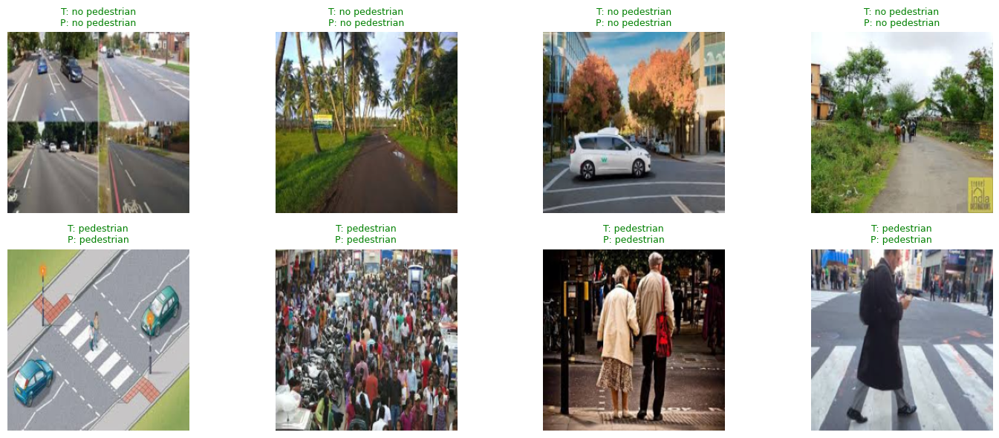

In [ ]:
# 1. Load your saved model
from torchvision.models import resnet18
from torch import nn
import torch
import matplotlib.pyplot as plt
import numpy as np
import random

def denormalize(img_tensor):
    """Undo ImageNet normalization to display images correctly."""
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose((1, 2, 0))
    img = std * img + mean  # unnormalize
    img = np.clip(img, 0, 1)
    return img

def show_class_examples(model, val_loader, class_names, samples_per_class=4):
    model.eval()
    collected = {cls: [] for cls in range(len(class_names))}

    # Flatten the whole loader into one list of (image, label, pred)
    all_examples = []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            preds = outputs.argmax(dim=1)
            for i in range(len(labels)):
                all_examples.append((images[i], labels[i], preds[i]))

    # Shuffle so you get different picks each run
    random.shuffle(all_examples)

    # Collect up to samples_per_class for each class
    for img, label, pred in all_examples:
        cls = label.item()
        if len(collected[cls]) < samples_per_class:
            collected[cls].append((img, label, pred))
        if all(len(v) >= samples_per_class for v in collected.values()):
            break

    # --- Plot
    total = samples_per_class * len(class_names)
    plt.figure(figsize=(15, 6))
    idx = 1
    for cls, examples in collected.items():
        for (img, label, pred) in examples:
            plt.subplot(len(class_names), samples_per_class, idx)
            idx += 1
            img = denormalize(img)
            plt.imshow(img)
            plt.title(
                f"T: {class_names[label.item()]}\nP: {class_names[pred.item()]}",
                color="green" if pred == label else "red",
                fontsize=9
            )
            plt.axis("off")
    plt.tight_layout()
    plt.show()

checkpoint = torch.load(
    "/content/drive/MyDrive/AAI3001/Project/models/resnet18_pedestrian.pt",
    map_location=DEVICE
)

# Recreate same model architecture
model = resnet18(weights=None)   # no pretrained weights here, we only load your trained weights
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, 2)
model.load_state_dict(checkpoint["model"])
model = model.to(DEVICE)

# 2. Reuse the class names (stored in checkpoint or from your earlier variable)
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

# 3. Show predictions
show_class_examples(model, val_loader, CLASS_NAMES, samples_per_class=4)

In [ ]:
# --- 6) Quick test: run inference on a few validation images
import random
model.eval()

with torch.no_grad():
    for _ in range(5):
        i = random.randrange(len(val_ds))
        img, target = val_ds[i]
        logits = model(img.unsqueeze(0).to(DEVICE))
        pred = logits.argmax(dim=1).item()
        print(f"Sample {i:4d} | true={CLASS_NAMES[target]} | pred={CLASS_NAMES[pred]}")

Sample  107 | true=pedestrian | pred=pedestrian
Sample  220 | true=no pedestrian | pred=no pedestrian
Sample  333 | true=no pedestrian | pred=no pedestrian
Sample  114 | true=pedestrian | pred=pedestrian
Sample  171 | true=pedestrian | pred=pedestrian


# ***Grayscale Preprocessing***

Added from base model:

* Grayscale transform added using transforms.Grayscale(num_output_channels=3)
    * Image is converted from color (RGB) to grayscale — so now every pixel just represents brightness (light or dark), not color
    * The num_output_channels=3 keeps the same number of channels (3) so that ResNet18 can still accept the input shape [3, 224, 224]
* Due to the image changing to grayscale, the normalization needs to change also
    * This is a simpler normalization that just scales pixel values from 0–1 range into roughly -1 to +1


Reason it doesn't perform well:
* ResNet18 was pretrained on ImageNet, a huge dataset of colored RGB photos
* When you feed in grayscale images:
    * All color information is gone

    * The patterns the model learned no longer apply properly (e.g., filters expecting red–green contrast now just see shades of gray.)

    * As a result, the pretrained layers can’t recognize features as effectively

    * Even though fine-tuned the last layer, much of the model’s “color-trained knowledge” is lost

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# --- 1) Imports & paths
import os, re
from pathlib import Path
import pandas as pd
from PIL import Image

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# 🔧 Multiprocessing-safe settings for notebooks (prevents teardown AssertionError)
import multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)   # safer in notebooks than "fork"
except RuntimeError:
    pass  # already set

# Use these when you create DataLoaders later
DATALOADER_KW = dict(
    num_workers=0,          # <— main fix: avoid background workers in notebooks
    pin_memory=False,       # safe default; you can set True if using CUDA
    persistent_workers=False
)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", DEVICE)

# Paths
TRAIN_DIR = Path("/content/drive/MyDrive/AAI3001/Project/data/train")
VAL_DIR   = Path("/content/drive/MyDrive/AAI3001/Project/data/validation")

TRAIN_CSV = TRAIN_DIR / "labels.csv"
VAL_CSV   = VAL_DIR / "labels.csv"

# Accept either correct or misspelled folder names
SUBDIR_ALIASES = {
    "pedestrian":      ["pedestrian", "pedestrain"],
    "no pedestrian":   ["no pedestrian", "no pedestrain"],
}

# For display & mapping
CLASS_NAMES = ["no pedestrian", "pedestrian"]   # index 0 -> no pedestrian, 1 -> pedestrian
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}

Device: cpu


In [ ]:
# --- 2) Dataset from CSV (normalizes labels, finds files even if folder names differ)
IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp"}

def normalize_label(s: str) -> str:
    s = s.strip().lower()
    # unify spellings
    s = s.replace("pedestrain", "pedestrian")
    # collapse multiple spaces
    s = re.sub(r"\s+", " ", s)
    # ensure "no pedestrian" has the leading 'no'
    if s in {"no pedestrian", "no pedestrain"}:
        s = "no pedestrian"
    if s == "pedestrian":
        return "pedestrian"
    if s == "no pedestrian":
        return "no pedestrian"
    raise ValueError(f"Unknown label in CSV: {s}")

def find_image_path(base_dir: Path, normalized_label: str, filename: str) -> Path:
    # Try each alias directory until we find the file
    for sub in SUBDIR_ALIASES[normalized_label]:
        candidate = base_dir / sub / filename
        if candidate.exists():
            return candidate
    # If not found, also try recursive search under aliased dirs (costly, but safe)
    for sub in SUBDIR_ALIASES[normalized_label]:
        root = base_dir / sub
        if root.exists():
            hits = list(root.rglob(filename))
            if hits:
                return hits[0]
    # Lastly, if CSV has relative paths (e.g., "pedestrian/img001.jpg"), try them directly
    rel_try = base_dir / filename
    if rel_try.exists():
        return rel_try
    raise FileNotFoundError(f"Could not locate image '{filename}' for label '{normalized_label}' under {base_dir}")

class CsvImageDataset(Dataset):
    def __init__(self, base_dir: Path, csv_path: Path, transform=None):
        assert base_dir.exists(), f"Base dir not found: {base_dir}"
        assert csv_path.exists(), f"CSV not found: {csv_path}"
        self.base_dir = base_dir
        self.df = pd.read_csv(csv_path)
        # Expecting columns: image, label
        assert {"image", "label"}.issubset(self.df.columns), "CSV must have columns: image, label"
        self.transform = transform

        # Pre-resolve absolute paths & targets
        self.samples = []
        for _, row in self.df.iterrows():
            raw_label = str(row["label"])
            norm_label = normalize_label(raw_label)
            fname = str(row["image"])
            # Allow CSV to hold either bare filename (img.jpg) or relative path (pedestrian/img.jpg)
            # If it's a relative path with subdir, prefer that; else use aliases.
            if "/" in fname or "\\" in fname:
                p = (self.base_dir / fname).resolve()
                if not p.exists():
                    # try to strip leading subdir and resolve via aliases
                    fname = Path(fname).name
                    p = find_image_path(self.base_dir, norm_label, fname)
            else:
                p = find_image_path(self.base_dir, norm_label, fname)

            target = CLASS_TO_IDX[norm_label]
            self.samples.append((p, target))

        print(f"Loaded {len(self.samples)} samples from {csv_path.name}")

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        with Image.open(path) as im:
            im = im.convert("RGB")
        if self.transform:
            im = self.transform(im)
        return im, target

In [ ]:
# --- 3) Transforms, datasets, dataloaders (Grayscale version)
train_tfms = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),   # convert to grayscale but keep 3 channels
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5),     # simple grayscale mean/std
                         std=(0.5, 0.5, 0.5)),
])

val_tfms = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5),
                         std=(0.5, 0.5, 0.5)),
])

train_ds = CsvImageDataset(TRAIN_DIR, TRAIN_CSV, transform=train_tfms)
val_ds   = CsvImageDataset(VAL_DIR,   VAL_CSV,   transform=val_tfms)

BATCH_SIZE = 32
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  **DATALOADER_KW)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **DATALOADER_KW)

Loaded 1262 samples from labels.csv
Loaded 354 samples from labels.csv


In [ ]:
# --- 4) Model: ResNet18 fine-tuning
from torchvision.models import resnet18, ResNet18_Weights

weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, 2)   # 2 classes

model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

In [ ]:
# --- 5) Train + validate
import math
from tqdm.auto import tqdm

def run_epoch(loader, train: bool):
    if train:
        model.train()
    else:
        model.eval()

    total, correct, total_loss = 0, 0, 0.0
    for x, y in tqdm(loader, leave=False):
        x, y = x.to(DEVICE, non_blocking=True), torch.as_tensor(y, device=DEVICE)

        if train:
            optimizer.zero_grad()

        with torch.set_grad_enabled(train):
            logits = model(x)
            loss = criterion(logits, y)
            if train:
                loss.backward()
                optimizer.step()

        total_loss += loss.item() * x.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == y).sum().item()
        total += x.size(0)

    avg_loss = total_loss / max(total, 1)
    acc = correct / max(total, 1)
    return avg_loss, acc

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/greyscale_pedestrian.pt"
os.makedirs(os.path.dirname(BEST_PATH), exist_ok=True)

EPOCHS = 8
best_val_acc = 0.0

for epoch in range(1, EPOCHS+1):
    train_loss, train_acc = run_epoch(train_loader, train=True)
    val_loss, val_acc = run_epoch(val_loader, train=False)
    print(f"Epoch {epoch:02d} | "
          f"train loss {train_loss:.4f}, acc {train_acc:.3f} | "
          f"val loss {val_loss:.4f}, acc {val_acc:.3f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({"model": model.state_dict(),
                    "class_names": CLASS_NAMES}, BEST_PATH)
        print(f"Saved new best model to {BEST_PATH} (val acc={best_val_acc:.3f})")

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 01 | train loss 0.2706, acc 0.880 | val loss 0.4535, acc 0.867
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/greyscale_pedestrian.pt (val acc=0.867)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 02 | train loss 0.1195, acc 0.958 | val loss 0.5391, acc 0.845


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 03 | train loss 0.0846, acc 0.976 | val loss 0.3120, acc 0.912
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/greyscale_pedestrian.pt (val acc=0.912)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 04 | train loss 0.0596, acc 0.979 | val loss 0.5066, acc 0.898


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 05 | train loss 0.0464, acc 0.986 | val loss 0.2941, acc 0.927
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/greyscale_pedestrian.pt (val acc=0.927)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 06 | train loss 0.0394, acc 0.986 | val loss 0.4607, acc 0.898


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 07 | train loss 0.0296, acc 0.990 | val loss 0.3978, acc 0.907


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 08 | train loss 0.0453, acc 0.984 | val loss 0.4074, acc 0.912


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# --- 6) Load best model (if saved)
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model"])
model.eval()

# --- 7) Collect predictions on validation set
all_targets, all_preds = [], []

with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        logits = model(x)
        preds = logits.argmax(dim=1)
        all_targets.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

all_targets = np.array(all_targets)
all_preds = np.array(all_preds)

# --- 8) Print classification report
print("Classification Report (Validation):")
print(classification_report(all_targets, all_preds, target_names=CLASS_NAMES))

# --- 9) Optional: confusion matrix
cm = confusion_matrix(all_targets, all_preds)
print("Confusion Matrix:")
print(cm)

Classification Report (Validation):
               precision    recall  f1-score   support

no pedestrian       0.88      0.99      0.93       177
   pedestrian       0.99      0.86      0.92       177

     accuracy                           0.93       354
    macro avg       0.93      0.93      0.93       354
 weighted avg       0.93      0.93      0.93       354

Confusion Matrix:
[[175   2]
 [ 24 153]]


# ***New Resnet 18 with Stronger RGB pipeline + Better optimization (scheduler + a few more epochs)***


Added stronger agument:
* Resize(256) + RandomResizedCrop(224, scale=(0.7,1.0), ratio=(0.9,1.1))
→ Teaches the model to handle zoom-in/zoom-out and slight aspect-ratio shifts
    * As previously Resize((224,224)) forces image toexactly 224 x 244 which sometimes stretching it unnaturally
    * In the improved version, resize to 256 first to make all images a bit bigger and crop randomly to 224 to take a random piece of the image that can cover 70%–100% of the image so the model sees a zoomed-in pedestrian, sometimes the whole scene and slightly changes the aspect ratio (width/height) to prepare the model for tall vs wide images, like different camera shapes

* ColorJitter(brightness=0.25, contrast=0.25, saturation=0.15, hue=0.03)
→ Robustness to lighting and color differences (shadows, dull/bright scenes)
    * Randomly changes lighting and colors to simulate different times of day, shadow conditions, or camera quality

Added smarter learning-rate schedule: AdamW(lr=3e-4) with OneCycleLR(max_lr=3e-4) → LR smoothly warms up then cools down during the epoch. This often converges a bit better than a fixed LR
* The learning rate gradually increases then decreases. This helps the model learn quickly at first, then refine carefully at the end, leading to better generalization compared to a fixed learning rate

Early stopping: Stop when validation stops improving (patience=3, min_delta=1e-4) → Avoids drifting into overfitting at later epochs so if the validation accuracy does not improve by 3 epoches, the model will stop training which prevents wasting time and keeps the model at its best point

These refinements improved generalization slightly, yielding about a +1% validation accuracy gain, small but expected given an already strong baseline and a modest validation set where each image moves accuracy by about 0.28%

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# --- 1) Imports & paths
import os, re
from pathlib import Path
import pandas as pd
from PIL import Image

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# 🔧 Multiprocessing-safe settings for notebooks (prevents teardown AssertionError)
import multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)   # safer in notebooks than "fork"
except RuntimeError:
    pass  # already set

# Use these when you create DataLoaders later
DATALOADER_KW = dict(
    num_workers=0,          # <— main fix: avoid background workers in notebooks
    pin_memory=False,       # safe default; you can set True if using CUDA
    persistent_workers=False
)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", DEVICE)

# Paths
TRAIN_DIR = Path("/content/drive/MyDrive/AAI3001/Project/data/train")
VAL_DIR   = Path("/content/drive/MyDrive/AAI3001/Project/data/validation")

TRAIN_CSV = TRAIN_DIR / "labels.csv"
VAL_CSV   = VAL_DIR / "labels.csv"

# Accept either correct or misspelled folder names
SUBDIR_ALIASES = {
    "pedestrian":      ["pedestrian", "pedestrain"],
    "no pedestrian":   ["no pedestrian", "no pedestrain"],
}

# For display & mapping
CLASS_NAMES = ["no pedestrian", "pedestrian"]   # index 0 -> no pedestrian, 1 -> pedestrian
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}

Device: cpu


In [ ]:
# --- 2) Dataset from CSV (normalizes labels, finds files even if folder names differ)
IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp"}

def normalize_label(s: str) -> str:
    s = s.strip().lower()
    # unify spellings
    s = s.replace("pedestrain", "pedestrian")
    # collapse multiple spaces
    s = re.sub(r"\s+", " ", s)
    # ensure "no pedestrian" has the leading 'no'
    if s in {"no pedestrian", "no pedestrain"}:
        s = "no pedestrian"
    if s == "pedestrian":
        return "pedestrian"
    if s == "no pedestrian":
        return "no pedestrian"
    raise ValueError(f"Unknown label in CSV: {s}")

def find_image_path(base_dir: Path, normalized_label: str, filename: str) -> Path:
    # Try each alias directory until we find the file
    for sub in SUBDIR_ALIASES[normalized_label]:
        candidate = base_dir / sub / filename
        if candidate.exists():
            return candidate
    # If not found, also try recursive search under aliased dirs (costly, but safe)
    for sub in SUBDIR_ALIASES[normalized_label]:
        root = base_dir / sub
        if root.exists():
            hits = list(root.rglob(filename))
            if hits:
                return hits[0]
    # Lastly, if CSV has relative paths (e.g., "pedestrian/img001.jpg"), try them directly
    rel_try = base_dir / filename
    if rel_try.exists():
        return rel_try
    raise FileNotFoundError(f"Could not locate image '{filename}' for label '{normalized_label}' under {base_dir}")

class CsvImageDataset(Dataset):
    def __init__(self, base_dir: Path, csv_path: Path, transform=None):
        assert base_dir.exists(), f"Base dir not found: {base_dir}"
        assert csv_path.exists(), f"CSV not found: {csv_path}"
        self.base_dir = base_dir
        self.df = pd.read_csv(csv_path)
        # Expecting columns: image, label
        assert {"image", "label"}.issubset(self.df.columns), "CSV must have columns: image, label"
        self.transform = transform

        # Pre-resolve absolute paths & targets
        self.samples = []
        for _, row in self.df.iterrows():
            raw_label = str(row["label"])
            norm_label = normalize_label(raw_label)
            fname = str(row["image"])
            # Allow CSV to hold either bare filename (img.jpg) or relative path (pedestrian/img.jpg)
            # If it's a relative path with subdir, prefer that; else use aliases.
            if "/" in fname or "\\" in fname:
                p = (self.base_dir / fname).resolve()
                if not p.exists():
                    # try to strip leading subdir and resolve via aliases
                    fname = Path(fname).name
                    p = find_image_path(self.base_dir, norm_label, fname)
            else:
                p = find_image_path(self.base_dir, norm_label, fname)

            target = CLASS_TO_IDX[norm_label]
            self.samples.append((p, target))

        print(f"Loaded {len(self.samples)} samples from {csv_path.name}")

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        with Image.open(path) as im:
            im = im.convert("RGB")
        if self.transform:
            im = self.transform(im)
        return im, target

In [ ]:
# --- 3) Transforms, datasets, dataloaders  (RGB with stronger augments)
from torchvision import transforms

train_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224, scale=(0.7, 1.0), ratio=(0.9, 1.1)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.15, hue=0.03),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

train_ds = CsvImageDataset(TRAIN_DIR, TRAIN_CSV, transform=train_tfms)
val_ds   = CsvImageDataset(VAL_DIR,   VAL_CSV,   transform=val_tfms)

BATCH_SIZE = 32
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  **DATALOADER_KW)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **DATALOADER_KW)

len(train_ds), len(val_ds)

Loaded 1262 samples from labels.csv
Loaded 354 samples from labels.csv


(1262, 354)

In [ ]:
# --- 4) Model: ResNet18 fine-tuning
from torchvision.models import resnet18, ResNet18_Weights

weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, 2)   # 2 classes

model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

In [ ]:
# --- 5) Train + validate  (One-Cycle LR + Early Stopping)
import math
from tqdm.auto import tqdm
from torch.optim.lr_scheduler import OneCycleLR

# Optimizer & scheduler
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
EPOCHS = 12
scheduler = OneCycleLR(
    optimizer,
    max_lr=3e-4,
    epochs=EPOCHS,
    steps_per_epoch=len(train_loader)
)

def run_epoch(loader, train: bool):
    if train:
        model.train()
    else:
        model.eval()

    total, correct, total_loss = 0, 0, 0.0
    for x, y in tqdm(loader, leave=False):
        x, y = x.to(DEVICE, non_blocking=True), torch.as_tensor(y, device=DEVICE)

        if train:
            optimizer.zero_grad()

        with torch.set_grad_enabled(train):
            logits = model(x)
            loss = criterion(logits, y)
            if train:
                loss.backward()
                optimizer.step()
                scheduler.step()  # OneCycle step each batch

        total_loss += loss.item() * x.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == y).sum().item()
        total += x.size(0)

    avg_loss = total_loss / max(total, 1)
    acc = correct / max(total, 1)
    return avg_loss, acc

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/newresnet18_pedestrian.pt"
os.makedirs(os.path.dirname(BEST_PATH), exist_ok=True)

# --- Early stopping config
patience   = 3          # stop after N epochs without improvement
min_delta  = 1e-4       # required improvement margin
no_improve = 0
best_val_acc = 0.0

for epoch in range(1, EPOCHS + 1):
    train_loss, train_acc = run_epoch(train_loader, train=True)
    val_loss, val_acc     = run_epoch(val_loader,   train=False)

    curr_lr = scheduler.get_last_lr()[0]
    print(f"Epoch {epoch:02d} | "
          f"train loss {train_loss:.4f}, acc {train_acc:.3f} | "
          f"val loss {val_loss:.4f}, acc {val_acc:.3f} | "
          f"lr {curr_lr:.2e}")

    # Check improvement (use > best + min_delta to avoid float noise)
    if val_acc > best_val_acc + min_delta:
        best_val_acc = val_acc
        no_improve = 0
        torch.save({"model": model.state_dict(),
                    "class_names": CLASS_NAMES}, BEST_PATH)
        print(f"Saved new best model to {BEST_PATH} (val acc={best_val_acc:.3f})")
    else:
        no_improve += 1
        print(f"No val acc improvement ({no_improve}/{patience})")

    # Early stop
    if no_improve >= patience:
        print(f"Early stopping: no improvement in {patience} consecutive epochs.")
        break

print(f"Best validation accuracy: {best_val_acc:.3f}")
print(f"Best model saved at: {BEST_PATH}")

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 01 | train loss 0.5104, acc 0.722 | val loss 0.2581, acc 0.907 | lr 6.41e-05
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/newresnet18_pedestrian.pt (val acc=0.907)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 02 | train loss 0.1709, acc 0.943 | val loss 0.2024, acc 0.932 | lr 1.83e-04
Saved new best model to /content/drive/MyDrive/AAI3001/Project/models/newresnet18_pedestrian.pt (val acc=0.932)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 03 | train loss 0.1426, acc 0.945 | val loss 0.3066, acc 0.884 | lr 2.82e-04
No val acc improvement (1/3)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 04 | train loss 0.1329, acc 0.943 | val loss 0.7663, acc 0.791 | lr 2.98e-04
No val acc improvement (2/3)


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Epoch 05 | train loss 0.1109, acc 0.962 | val loss 0.4857, acc 0.867 | lr 2.79e-04
No val acc improvement (3/3)
Early stopping: no improvement in 3 consecutive epochs.
Best validation accuracy: 0.932
Best model saved at: /content/drive/MyDrive/AAI3001/Project/models/newresnet18_pedestrian.pt


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# --- 6) Load best model (if saved)
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model"])
model.eval()

# --- 7) Collect predictions on validation set
all_targets, all_preds = [], []

with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        logits = model(x)
        preds = logits.argmax(dim=1)
        all_targets.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

all_targets = np.array(all_targets)
all_preds = np.array(all_preds)

# --- 8) Print classification report
print("Classification Report (Validation):")
print(classification_report(all_targets, all_preds, target_names=CLASS_NAMES))

# --- 9) Optional: confusion matrix
cm = confusion_matrix(all_targets, all_preds)
print("Confusion Matrix:")
print(cm)

Classification Report (Validation):
               precision    recall  f1-score   support

no pedestrian       0.89      0.99      0.94       177
   pedestrian       0.99      0.88      0.93       177

     accuracy                           0.93       354
    macro avg       0.94      0.93      0.93       354
 weighted avg       0.94      0.93      0.93       354

Confusion Matrix:
[[175   2]
 [ 22 155]]


# ***Resnet 18 Fine-Tuning with Balanced Sampling and Data Augmentation***

* Uses milder agumentation with smaller rotation, tighter crop ratios and added RandomErasing that hides small random patches that teaches the model not to rely on one single detail (like a person’s head), but to recognize pedestrians even if part of them is missing

* Added a WeightedRandomSampler so that both classes appear equally often in each batch, even if one class has fewer images and it prevents the model from being biased toward the more common class

* In the CrossEntropyLoss:

    * Added Class weights → gives more penalty if the model misses a pedestrian (to reduce false negatives)

    * Added Label smoothing (0.05) → slightly softens the target labels so the model doesn’t become overconfident and memorizing noise (less chance of overfitting)

* Divided the model training into 2 phases:
    * Phase A: freeze the pretrained backbone and only train the last layer (“head”) which makes the head adapt quickly to dataset without disturbing the pretrained features from ImageNet

    * Phase B: unfreeze everything and fine-tune the whole network at a smaller learning rate that refines all weights carefully once the head has learned the task

    * This allow the model to be more stable training and better use of pretrained knowledge


By adding balanced sampling, class-weighted loss with label smoothing, random erasing, and a two-phase training strategy, these changes reduced bias toward one class and made the model less overconfident. As a result, the validation accuracy increased from 95% to 96%, with more balanced precision and recall across both “pedestrian” and “no pedestrian” classes

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os, re, random
from pathlib import Path
import numpy as np
import pandas as pd
from PIL import Image

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms
from torchvision.models import resnet18, ResNet18_Weights

# multiprocessing safety in notebooks
import multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)
except RuntimeError:
    pass

# Reproducibility (optional, comment out if you don’t want fixed seed)
SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", DEVICE)

# Fast, stable dataloaders for notebooks
DATALOADER_KW = dict(num_workers=0, pin_memory=False, persistent_workers=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cpu


In [ ]:
# =========================
# 1) Paths & Class mapping
# =========================
TRAIN_DIR = Path("/content/drive/MyDrive/AAI3001/Project/data/train")
VAL_DIR   = Path("/content/drive/MyDrive/AAI3001/Project/data/validation")

TRAIN_CSV = TRAIN_DIR / "labels.csv"
VAL_CSV   = VAL_DIR / "labels.csv"

CLASS_NAMES = ["no pedestrian", "pedestrian"]   # 0, 1
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}

SUBDIR_ALIASES = {
    "pedestrian":      ["pedestrian", "pedestrain"],
    "no pedestrian":   ["no pedestrian", "no pedestrain"],
}

In [ ]:
# =========================
# 2) Dataset
# =========================
IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp"}

def normalize_label(s: str) -> str:
    s = s.strip().lower()
    s = s.replace("pedestrain", "pedestrian")
    s = re.sub(r"\s+", " ", s)
    if s in {"no pedestrian", "no pedestrain"}:
        return "no pedestrian"
    if s == "pedestrian":
        return "pedestrian"
    raise ValueError(f"Unknown label in CSV: {s}")

def find_image_path(base_dir: Path, normalized_label: str, filename: str) -> Path:
    for sub in SUBDIR_ALIASES[normalized_label]:
        candidate = base_dir / sub / filename
        if candidate.exists():
            return candidate
    for sub in SUBDIR_ALIASES[normalized_label]:
        root = base_dir / sub
        if root.exists():
            hits = list(root.rglob(filename))
            if hits:
                return hits[0]
    rel_try = base_dir / filename
    if rel_try.exists():
        return rel_try
    raise FileNotFoundError(f"Could not locate '{filename}' for label '{normalized_label}' under {base_dir}")

class CsvImageDataset(Dataset):
    def __init__(self, base_dir: Path, csv_path: Path, transform=None):
        assert base_dir.exists(), f"Base dir not found: {base_dir}"
        assert csv_path.exists(), f"CSV not found: {csv_path}"
        self.base_dir = base_dir
        self.df = pd.read_csv(csv_path)
        assert {"image", "label"}.issubset(self.df.columns), "CSV must have columns: image, label"
        self.transform = transform

        self.samples = []
        for _, row in self.df.iterrows():
            norm_label = normalize_label(str(row["label"]))
            fname = str(row["image"])
            if "/" in fname or "\\" in fname:
                p = (self.base_dir / fname).resolve()
                if not p.exists():
                    fname = Path(fname).name
                    p = find_image_path(self.base_dir, norm_label, fname)
            else:
                p = find_image_path(self.base_dir, norm_label, fname)
            target = CLASS_TO_IDX[norm_label]
            self.samples.append((p, target))

        print(f"Loaded {len(self.samples)} samples from {csv_path.name}")

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        with Image.open(path) as im:
            im = im.convert("RGB")
        if self.transform:
            im = self.transform(im)
        return im, target

In [ ]:
# =========================
# 3) Transforms & Dataloaders
# (mild but useful augments; keep RGB)
# =========================
train_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.95, 1.05)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(6),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
    transforms.RandomErasing(p=0.15, scale=(0.02, 0.08), ratio=(0.3, 3.3), value='random'),
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

train_ds = CsvImageDataset(TRAIN_DIR, TRAIN_CSV, transform=train_tfms)
val_ds   = CsvImageDataset(VAL_DIR,   VAL_CSV,   transform=val_tfms)

# Balanced sampler (each class appears fairly in batches)
labels_np = np.array([y for _, y in train_ds.samples])
class_counts = np.bincount(labels_np)               # [count_no, count_ped]
class_w_for_sampler = 1.0 / np.maximum(class_counts, 1)
sample_weights = class_w_for_sampler[labels_np]
sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)

BATCH_SIZE = 32
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=sampler, **DATALOADER_KW)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **DATALOADER_KW)

Loaded 1262 samples from labels.csv
Loaded 354 samples from labels.csv


In [ ]:
# =========================
# 4) Model + Loss + Optimizer
# =========================
weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, 2)
model = model.to(DEVICE)

# class-weighted loss (+ label smoothing)
n0, n1 = (class_counts.tolist() + [0,0])[:2]  # safe unpack
w0 = 1.0
w1 = max(1.5, n0 / max(n1, 1))   # bias toward catching pedestrians; try 1.5–2.5
class_weights = torch.tensor([w0, w1], dtype=torch.float, device=DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)

In [ ]:
# =========================
# 5) Train utilities
# =========================
def run_epoch(loader, train: bool, optimizer=None):
    model.train() if train else model.eval()
    total, correct, total_loss = 0, 0, 0.0
    for x, y in loader:
        x, y = x.to(DEVICE, non_blocking=True), torch.as_tensor(y, device=DEVICE)
        if train:
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(x)
            loss = criterion(logits, y)
            if train:
                loss.backward()
                optimizer.step()
        total_loss += loss.item() * x.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == y).sum().item()
        total += x.size(0)
    return total_loss / max(total,1), correct / max(total,1)

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt"
os.makedirs(os.path.dirname(BEST_PATH), exist_ok=True)

In [ ]:
# =========================
# 6) Phase A: warm up head (freeze backbone)
# =========================
for p in model.layer1.parameters(): p.requires_grad = False
for p in model.layer2.parameters(): p.requires_grad = False
for p in model.layer3.parameters(): p.requires_grad = False
for p in model.layer4.parameters(): p.requires_grad = False

optA = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()),
                         lr=3e-4, weight_decay=1e-4)

EPOCHS_A = 2
print("\n== Phase A: warm up head ==")
for ep in range(1, EPOCHS_A+1):
    tr_loss, tr_acc = run_epoch(train_loader, True, optimizer=optA)
    va_loss, va_acc = run_epoch(val_loader,   False)
    print(f"[A{ep:02d}] train {tr_acc:.3f} | val {va_acc:.3f}")

best_val_acc = 0.0


== Phase A: warm up head ==
[A01] train 0.587 | val 0.703
[A02] train 0.773 | val 0.814


In [ ]:
# =========================
# 7) Phase B: unfreeze all, fine-tune
# =========================
for p in model.parameters(): p.requires_grad = True
optB = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

EPOCHS_B = 8
print("\n== Phase B: fine-tune all ==")
for ep in range(1, EPOCHS_B+1):
    tr_loss, tr_acc = run_epoch(train_loader, True, optimizer=optB)
    va_loss, va_acc = run_epoch(val_loader,   False)
    print(f"[B{ep:02d}] train loss {tr_loss:.4f}, acc {tr_acc:.3f} | val loss {va_loss:.4f}, acc {va_acc:.3f}")

    if va_acc > best_val_acc:   # strict '>'
        best_val_acc = va_acc
        torch.save({"model": model.state_dict(),
                    "class_names": CLASS_NAMES}, BEST_PATH)
        print(f"Saved best model (val acc={best_val_acc:.3f}) -> {BEST_PATH}")


== Phase B: fine-tune all ==
[B01] train loss 0.2583, acc 0.927 | val loss 0.3152, acc 0.904
Saved best model (val acc=0.904) -> /content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt
[B02] train loss 0.1880, acc 0.969 | val loss 0.2843, acc 0.927
Saved best model (val acc=0.927) -> /content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt
[B03] train loss 0.1791, acc 0.978 | val loss 0.3043, acc 0.929
Saved best model (val acc=0.929) -> /content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt
[B04] train loss 0.1642, acc 0.983 | val loss 0.2782, acc 0.932
Saved best model (val acc=0.932) -> /content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt
[B05] train loss 0.1596, acc 0.987 | val loss 0.2572, acc 0.941
Saved best model (val acc=0.941) -> /content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt
[B06] train loss 0.1523, acc 0.990 | val loss 0.2389, acc 0.958
Saved best model (val acc=0.958) -> 

In [ ]:
# =========================
# 8) Evaluation (baseline τ=0.50)
# =========================
from sklearn.metrics import classification_report, confusion_matrix

# load best
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model"])
model.eval()

all_targets, all_preds = [], []
with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        logits = model(x)
        preds = logits.argmax(dim=1)
        all_targets.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

all_targets = np.array(all_targets); all_preds = np.array(all_preds)
print("\n=== Validation report (τ=0.50 argmax) ===")
print(classification_report(all_targets, all_preds, target_names=CLASS_NAMES))
print("Confusion Matrix:")
print(confusion_matrix(all_targets, all_preds))


=== Validation report (τ=0.50 argmax) ===
               precision    recall  f1-score   support

no pedestrian       0.95      0.97      0.96       177
   pedestrian       0.97      0.94      0.96       177

     accuracy                           0.96       354
    macro avg       0.96      0.96      0.96       354
 weighted avg       0.96      0.96      0.96       354

Confusion Matrix:
[[172   5]
 [ 10 167]]


In [ ]:
# =========================
# 9) Optional: TTA + threshold sweep to tune pedestrian recall / no-ped precision
# =========================
def predict_tta_logits(model, x):
    logits = model(x)
    logits += model(torch.flip(x, dims=[3]))  # H-flip
    return logits / 2.0

probs, targets = [], []
with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        logits = predict_tta_logits(model, x)    # TTA logits
        p = torch.softmax(logits, dim=1)[:, 1]   # prob of "pedestrian" (class 1)
        probs.extend(p.cpu().numpy()); targets.extend(y.cpu().numpy())
probs = np.array(probs); targets = np.array(targets)

from sklearn.metrics import precision_recall_fscore_support, f1_score
def metrics_at(t):
    pr = (probs > t).astype(int)
    prec, rec, f1, sup = precision_recall_fscore_support(targets, pr, labels=[0,1], zero_division=0)
    acc = (pr == targets).mean()
    return {"t":t, "prec_no":prec[0], "rec_no":rec[0], "f1_no":f1[0],
                  "prec_ped":prec[1], "rec_ped":rec[1], "f1_ped":f1[1], "acc":acc}

ths = np.linspace(0.30, 0.70, 41)
rows = [metrics_at(t) for t in ths]

# Choose by your objective:
BASE_PREC_NO = 0.91  # keep at/above your baseline no-ped precision
candidates = [r for r in rows if r["prec_no"] >= BASE_PREC_NO]
bestA = max(candidates, key=lambda r: r["rec_ped"]) if candidates else max(rows, key=lambda r: r["rec_ped"])
best_t = bestA["t"]
print(f"\nChosen threshold τ={best_t:.2f} (goal: max rec_ped with prec_no≥{BASE_PREC_NO})")

final_preds = (probs > best_t).astype(int)
print("\n=== Validation report (TTA + tuned τ) ===")
print(classification_report(targets, final_preds, target_names=CLASS_NAMES))
print("Confusion Matrix:")
print(confusion_matrix(targets, final_preds))


Chosen threshold τ=0.30 (goal: max rec_ped with prec_no≥0.91)

=== Validation report (TTA + tuned τ) ===
               precision    recall  f1-score   support

no pedestrian       0.95      0.95      0.95       177
   pedestrian       0.95      0.95      0.95       177

     accuracy                           0.95       354
    macro avg       0.95      0.95      0.95       354
 weighted avg       0.95      0.95      0.95       354

Confusion Matrix:
[[168   9]
 [  8 169]]


# ***Testing***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ===== Single-image inference =====
import torch
from torch import nn
from torchvision import transforms
from torchvision.models import resnet18
from PIL import Image
import numpy as np

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt"

# 1) Recreate model + load weights
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)

model = resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(checkpoint["model"])
model = model.to(DEVICE).eval()

# 2) Class names (from checkpoint, fallback if absent)
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

# 3) Validation transforms (match what you used for eval)
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

def load_image(path):
    im = Image.open(path).convert("RGB")
    return val_tfms(im).unsqueeze(0)  # BCHW

@torch.no_grad()
def predict_image(image_path, threshold=0.50, use_tta=True):
    x = load_image(image_path).to(DEVICE)

    if use_tta:
        # simple TTA: original + horizontal flip
        logits = model(x)
        logits += model(torch.flip(x, dims=[3]))
        logits /= 2.0
    else:
        logits = model(x)

    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    pred_idx = int(np.argmax(probs))
    pred_name = CLASS_NAMES[pred_idx]
    ped_prob = float(probs[CLASS_NAMES.index("pedestrian")])

    # Thresholded decision for pedestrian (class 1)
    is_pedestrian = ped_prob > threshold

    print(f"Image: {image_path}")
    print(f"Predicted: {pred_name}  |  P(no pedestrian)={probs[0]:.3f}, P(pedestrian)={probs[1]:.3f}")
    print(f"Decision @ τ={threshold:.2f}: {'pedestrian' if is_pedestrian else 'no pedestrian'}")
    return probs, pred_idx

# ===== Set your image path and run =====
# Example paths:
#   - If you uploaded via Colab file upload: "/content/your_file.jpg"
#   - If it lives in Drive: "/content/drive/MyDrive/AAI3001/Project/some_folder/your_file.jpg"
IMAGE_PATH = "/content/608220c8-e8b7-4723-8507-6bf6e2d55bca.jpg"   # <-- put your file path here

_ = predict_image(IMAGE_PATH, threshold=0.50, use_tta=True)

Image: /content/608220c8-e8b7-4723-8507-6bf6e2d55bca.jpg
Predicted: pedestrian  |  P(no pedestrian)=0.097, P(pedestrian)=0.903
Decision @ τ=0.50: pedestrian


In [ ]:
# ===== Single-image inference =====
import torch
from torch import nn
from torchvision import transforms
from torchvision.models import resnet18
from PIL import Image
import numpy as np

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt"

# 1) Recreate model + load weights
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)

model = resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(checkpoint["model"])
model = model.to(DEVICE).eval()

# 2) Class names (from checkpoint, fallback if absent)
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

# 3) Validation transforms (match what you used for eval)
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

def load_image(path):
    im = Image.open(path).convert("RGB")
    return val_tfms(im).unsqueeze(0)  # BCHW

@torch.no_grad()
def predict_image(image_path, threshold=0.50, use_tta=True):
    x = load_image(image_path).to(DEVICE)

    if use_tta:
        # simple TTA: original + horizontal flip
        logits = model(x)
        logits += model(torch.flip(x, dims=[3]))
        logits /= 2.0
    else:
        logits = model(x)

    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    pred_idx = int(np.argmax(probs))
    pred_name = CLASS_NAMES[pred_idx]
    ped_prob = float(probs[CLASS_NAMES.index("pedestrian")])

    # Thresholded decision for pedestrian (class 1)
    is_pedestrian = ped_prob > threshold

    print(f"Image: {image_path}")
    print(f"Predicted: {pred_name}  |  P(no pedestrian)={probs[0]:.3f}, P(pedestrian)={probs[1]:.3f}")
    print(f"Decision @ τ={threshold:.2f}: {'pedestrian' if is_pedestrian else 'no pedestrian'}")
    return probs, pred_idx

# ===== Set your image path and run =====
# Example paths:
#   - If you uploaded via Colab file upload: "/content/your_file.jpg"
#   - If it lives in Drive: "/content/drive/MyDrive/AAI3001/Project/some_folder/your_file.jpg"
IMAGE_PATH = "/content/Screenshot 2023-03-16 045843.png"   # <-- put your file path here

_ = predict_image(IMAGE_PATH, threshold=0.50, use_tta=True)

Image: /content/Screenshot 2023-03-16 045843.png
Predicted: pedestrian  |  P(no pedestrian)=0.381, P(pedestrian)=0.619
Decision @ τ=0.50: pedestrian


In [ ]:
# ===== Single-image inference =====
import torch
from torch import nn
from torchvision import transforms
from torchvision.models import resnet18
from PIL import Image
import numpy as np

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt"

# 1) Recreate model + load weights
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)

model = resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(checkpoint["model"])
model = model.to(DEVICE).eval()

# 2) Class names (from checkpoint, fallback if absent)
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

# 3) Validation transforms (match what you used for eval)
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

def load_image(path):
    im = Image.open(path).convert("RGB")
    return val_tfms(im).unsqueeze(0)  # BCHW

@torch.no_grad()
def predict_image(image_path, threshold=0.50, use_tta=True):
    x = load_image(image_path).to(DEVICE)

    if use_tta:
        # simple TTA: original + horizontal flip
        logits = model(x)
        logits += model(torch.flip(x, dims=[3]))
        logits /= 2.0
    else:
        logits = model(x)

    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    pred_idx = int(np.argmax(probs))
    pred_name = CLASS_NAMES[pred_idx]
    ped_prob = float(probs[CLASS_NAMES.index("pedestrian")])

    # Thresholded decision for pedestrian (class 1)
    is_pedestrian = ped_prob > threshold

    print(f"Image: {image_path}")
    print(f"Predicted: {pred_name}  |  P(no pedestrian)={probs[0]:.3f}, P(pedestrian)={probs[1]:.3f}")
    print(f"Decision @ τ={threshold:.2f}: {'pedestrian' if is_pedestrian else 'no pedestrian'}")
    return probs, pred_idx

# ===== Set your image path and run =====
# Example paths:
#   - If you uploaded via Colab file upload: "/content/your_file.jpg"
#   - If it lives in Drive: "/content/drive/MyDrive/AAI3001/Project/some_folder/your_file.jpg"
IMAGE_PATH = "/content/Screenshot 2023-03-16 045843.png"   # <-- put your file path here

_ = predict_image(IMAGE_PATH, threshold=0.70, use_tta=True)

Image: /content/Screenshot 2023-03-16 045843.png
Predicted: pedestrian  |  P(no pedestrian)=0.381, P(pedestrian)=0.619
Decision @ τ=0.70: no pedestrian


In [ ]:
import numpy as np
from sklearn.metrics import precision_recall_fscore_support

# Collect probs for class 1 = "pedestrian" on VALIDATION SET
model.eval()
probs, targets = [], []
with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)
        p = torch.softmax(model(x), dim=1)[:, 1]
        probs.extend(p.cpu().numpy()); targets.extend(y.cpu().numpy())
probs = np.array(probs); targets = np.array(targets)

def metrics_at(t):
    pred = (probs > t).astype(int)
    prec, rec, f1, sup = precision_recall_fscore_support(targets, pred, labels=[0,1], zero_division=0)
    # index 0 = "no pedestrian", index 1 = "pedestrian"
    return dict(t=t,
                prec_no=prec[0], rec_no=rec[0],
                prec_ped=prec[1], rec_ped=rec[1])

# choose threshold with constraint: precision(no pedestrian) >= TARGET
TARGET_NO_PED_PREC = 0.97   # tighten/loosen this as you like
candidates = []
for t in np.linspace(0.50, 0.95, 91):  # search high thresholds to be conservative
    m = metrics_at(t)
    if m["prec_no"] >= TARGET_NO_PED_PREC:
        candidates.append(m)

if not candidates:  # fall back if constraint impossible
    best = max([metrics_at(t) for t in np.linspace(0.30, 0.90, 61)], key=lambda x: x["rec_ped"])
else:
    # among candidates, keep the one with best pedestrian recall
    best = max(candidates, key=lambda x: x["rec_ped"])

BEST_THRESHOLD = best["t"]
print("Selected τ*: ", BEST_THRESHOLD, "| metrics:", best)

Selected τ*:  0.3 | metrics: {'t': np.float64(0.3), 'prec_no': np.float64(0.9540229885057471), 'rec_no': np.float64(0.9378531073446328), 'prec_ped': np.float64(0.9388888888888889), 'rec_ped': np.float64(0.9548022598870056)}


In [ ]:
from torchvision import transforms
from torchvision.models import resnet18
from torch import nn
from PIL import Image

# load model (you already have this)
checkpoint = torch.load("/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt", map_location=DEVICE)
model = resnet18(weights=None); model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(checkpoint["model"]); model = model.to(DEVICE).eval()
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

def load_image(path):
    return val_tfms(Image.open(path).convert("RGB")).unsqueeze(0)

@torch.no_grad()
def predict_image(path, threshold=None, abstain_cutoff=0.60, use_tta=True):
    x = load_image(path).to(DEVICE)
    logits = model(x)
    if use_tta:
        logits = (logits + model(torch.flip(x, dims=[3]))) / 2.0
    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    p_ped = float(probs[1]); p_no = float(probs[0])

    # abstain if not confident
    if max(p_no, p_ped) < abstain_cutoff:
        decision = "uncertain"
    else:
        τ = 0.50 if threshold is None else float(threshold)
        decision = "pedestrian" if p_ped > τ else "no pedestrian"

    print(f"Image: {path}")
    print(f"P(no pedestrian)={p_no:.3f} | P(pedestrian)={p_ped:.3f}")
    print(f"Decision @ τ={ (0.50 if threshold is None else threshold):.2f} (abstain<{abstain_cutoff}): {decision}")
    return probs, decision

# Use the tuned τ* from step 1:
IMAGE_PATH = "/content/Screenshot 2023-03-16 045843.png"  # your cat meme path
_ = predict_image(IMAGE_PATH, threshold=BEST_THRESHOLD, abstain_cutoff=0.60, use_tta=True)

Image: /content/Screenshot 2023-03-16 045843.png
P(no pedestrian)=0.381 | P(pedestrian)=0.619
Decision @ τ=0.30 (abstain<0.6): pedestrian


=== Single Image Inference ===
Image: /content/608220c8-e8b7-4723-8507-6bf6e2d55bca.jpg
Predicted: pedestrian  |  P(no pedestrian)=0.002, P(pedestrian)=0.998
Decision @ τ=0.50: pedestrian

=== Visualizing Original Image ===


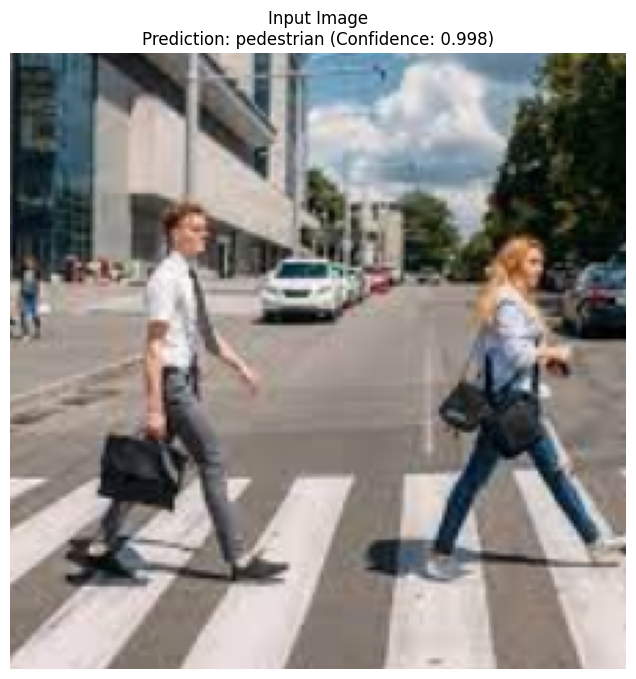


=== Visualizing Conv1 Filters ===
Visualizing filters from layer: conv1
Filter shape: (64, 3, 7, 7)


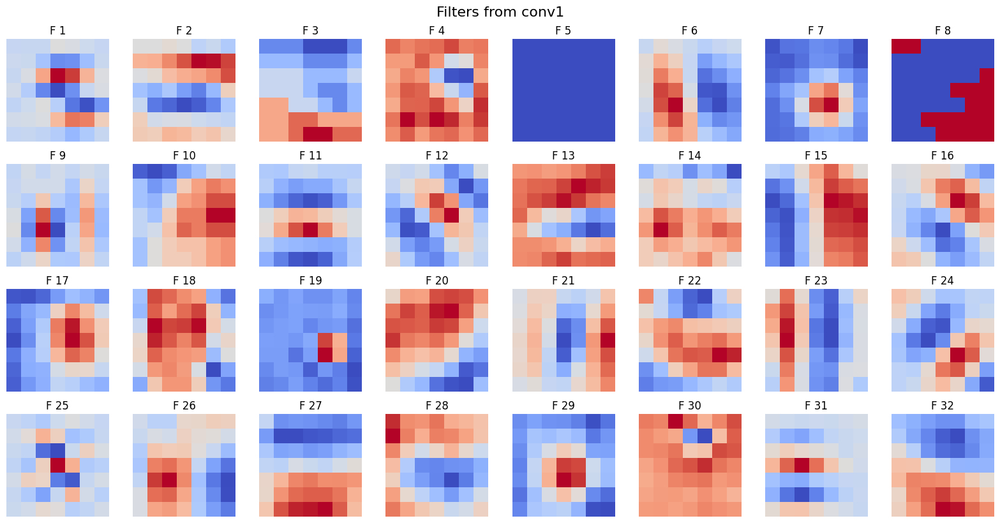


=== Visualizing Feature Maps from Conv1 ===
Feature maps from layer 'conv1': torch.Size([1, 64, 112, 112])


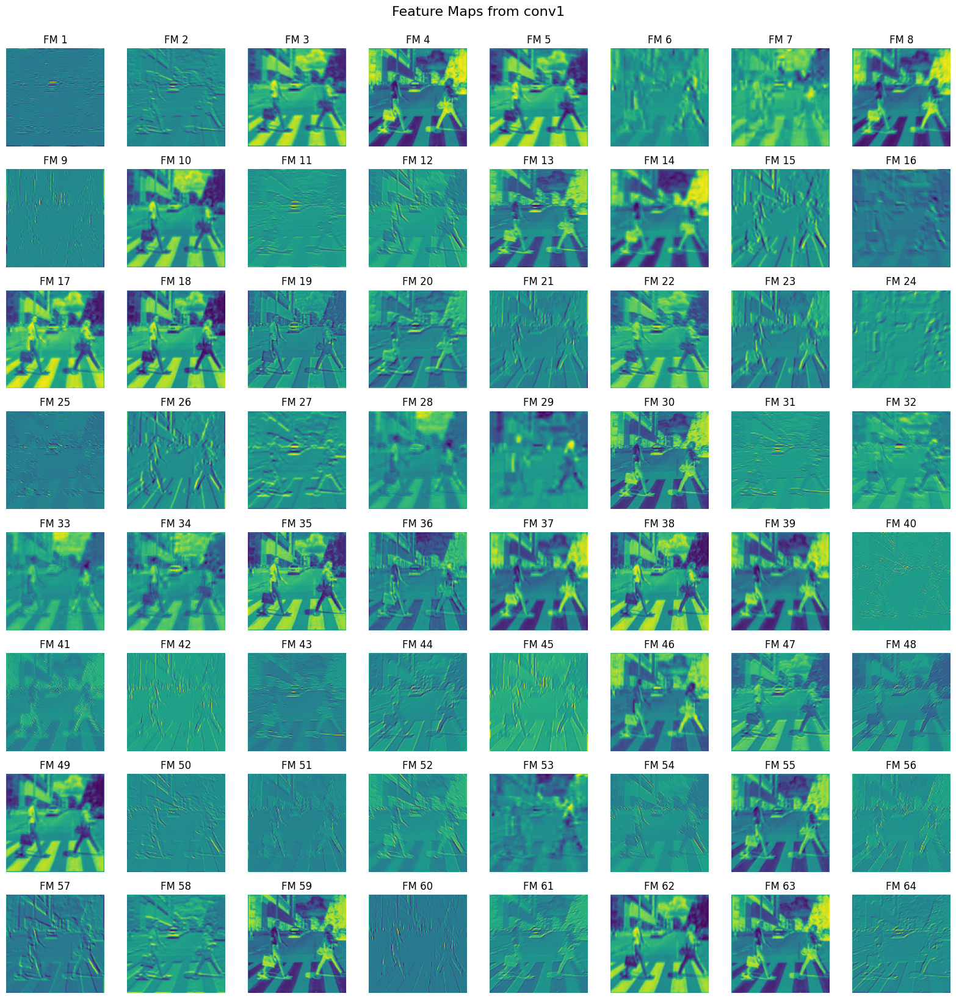


=== Visualizing Feature Maps from Layer1 ===
Feature maps from layer 'layer1': torch.Size([1, 64, 56, 56])


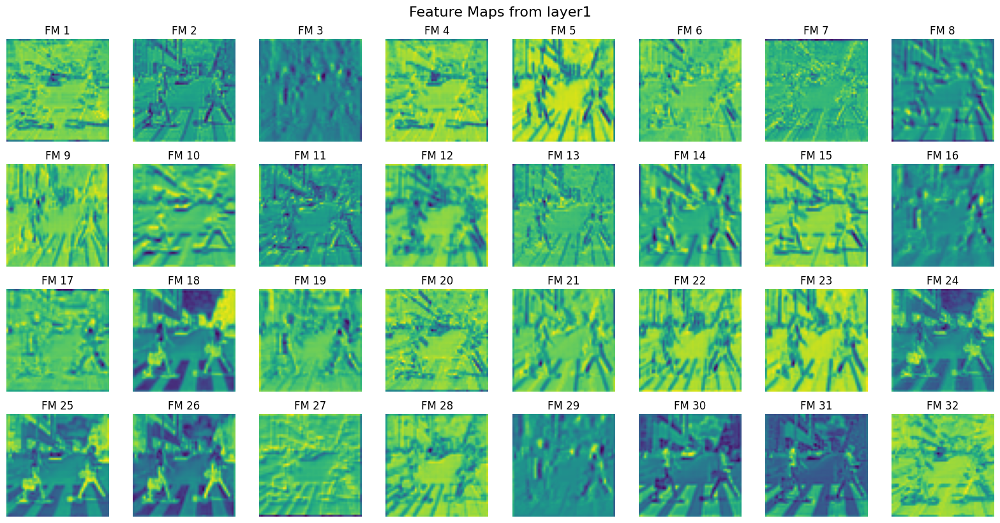


=== Visualizing Feature Maps from Layer2 ===
Feature maps from layer 'layer2': torch.Size([1, 128, 28, 28])


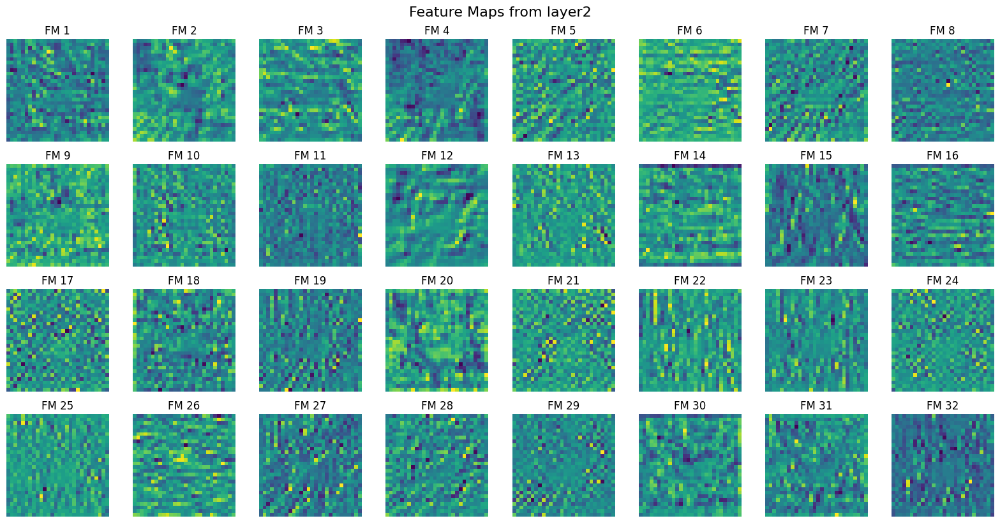

In [ ]:
# ===== Single-image inference with Feature Map Visualization =====
import torch
from torch import nn
from torchvision import transforms
from torchvision.models import resnet18
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt"

# 1) Recreate model + load weights
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)

model = resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(checkpoint["model"])
model = model.to(DEVICE).eval()

# 2) Class names (from checkpoint, fallback if absent)
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

# 3) Validation transforms (match what you used for eval)
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

def load_image(path):
    im = Image.open(path).convert("RGB")
    return val_tfms(im).unsqueeze(0)  # BCHW

@torch.no_grad()
def predict_image(image_path, threshold=0.50, use_tta=True):
    x = load_image(image_path).to(DEVICE)

    if use_tta:
        # simple TTA: original + horizontal flip
        logits = model(x)
        logits += model(torch.flip(x, dims=[3]))
        logits /= 2.0
    else:
        logits = model(x)

    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    pred_idx = int(np.argmax(probs))
    pred_name = CLASS_NAMES[pred_idx]
    ped_prob = float(probs[CLASS_NAMES.index("pedestrian")])

    # Thresholded decision for pedestrian (class 1)
    is_pedestrian = ped_prob > threshold

    print(f"Image: {image_path}")
    print(f"Predicted: {pred_name}  |  P(no pedestrian)={probs[0]:.3f}, P(pedestrian)={probs[1]:.3f}")
    print(f"Decision @ τ={threshold:.2f}: {'pedestrian' if is_pedestrian else 'no pedestrian'}")

    # Return both the processed tensor and the prediction results
    return x, probs, pred_idx

def denormalize(tensor):
    """Reverse the normalization for visualization"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    tensor = tensor * std + mean  # unnormalize
    tensor = torch.clamp(tensor, 0, 1)
    return tensor

def visualize_feature_maps_pytorch(model, sample_image, layer_name='conv1', num_filters=64):
    """
    Visualize the feature maps (activations) for a given input image - PyTorch version
    """
    # Set model to evaluation mode
    model.eval()

    # Hook to capture activations
    activations = {}

    def get_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook

    # Register hook for the specified convolutional layer
    if layer_name == 'conv1':
        target_layer = model.conv1
    elif layer_name == 'layer1':
        target_layer = model.layer1[0].conv1
    elif layer_name == 'layer2':
        target_layer = model.layer2[0].conv1
    else:
        print(f"Layer {layer_name} not found, using conv1")
        target_layer = model.conv1

    target_layer.register_forward_hook(get_activation(layer_name))

    # Forward pass
    with torch.no_grad():
        _ = model(sample_image)

    # Get the activations
    if layer_name in activations:
        feature_maps = activations[layer_name]
        print(f"Feature maps from layer '{layer_name}': {feature_maps.shape}")

        # Move to CPU and convert to numpy
        feature_maps = feature_maps.squeeze(0).cpu().numpy()

        # Limit to first num_filters for visualization
        n_features = min(feature_maps.shape[0], num_filters)

        # Determine the grid size for plotting
        n_cols = 8
        n_rows = int(np.ceil(n_features / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2))

        # Handle case when there's only one row
        if n_rows == 1:
            axes = axes.reshape(1, -1)

        for i in range(n_features):
            row = i // n_cols
            col = i % n_cols

            # Get the feature map
            feature_map = feature_maps[i]

            # Normalize for better visualization
            feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min() + 1e-8)

            axes[row, col].imshow(feature_map, cmap='viridis')
            axes[row, col].set_title(f'FM {i+1}')
            axes[row, col].axis('off')

        # Hide empty subplots
        for i in range(n_features, n_rows * n_cols):
            row = i // n_cols
            col = i % n_cols
            axes[row, col].axis('off')

        plt.tight_layout()
        plt.suptitle(f'Feature Maps from {layer_name}', fontsize=16, y=1.02)
        plt.show()
    else:
        print(f"Could not capture feature maps from layer {layer_name}")

def visualize_conv_filters_pytorch(model, layer_name='conv1', num_filters=32):
    """
    Visualize the filters/weights of convolutional layers - PyTorch version
    """
    # Get the target layer
    if layer_name == 'conv1':
        target_layer = model.conv1
    elif layer_name == 'layer1':
        target_layer = model.layer1[0].conv1
    elif layer_name == 'layer2':
        target_layer = model.layer2[0].conv1
    else:
        print(f"Layer {layer_name} not found, using conv1")
        target_layer = model.conv1

    # Get the weights
    weights = target_layer.weight.data.cpu().numpy()

    print(f"Visualizing filters from layer: {layer_name}")
    print(f"Filter shape: {weights.shape}")

    # Take only the first num_filters
    weights = weights[:num_filters]

    # Normalize the weights to [0, 1] for visualization
    weights = (weights - weights.min()) / (weights.max() - weights.min())

    # Determine the grid size for plotting
    n_filters = weights.shape[0]
    n_cols = 8
    n_rows = int(np.ceil(n_filters / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2))

    # Handle case when there's only one row
    if n_rows == 1:
        axes = axes.reshape(1, -1)

    for i in range(n_filters):
        row = i // n_cols
        col = i % n_cols

        # Get the filter (for first input channel)
        if weights.shape[1] == 3:  # RGB filter
            # Show average across channels or first channel
            filter_img = weights[i, 0]  # First channel
        else:
            filter_img = weights[i, 0]  # First channel

        axes[row, col].imshow(filter_img, cmap='coolwarm')
        axes[row, col].set_title(f'F {i+1}')
        axes[row, col].axis('off')

    # Hide empty subplots
    for i in range(n_filters, n_rows * n_cols):
        row = i // n_cols
        col = i % n_cols
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.suptitle(f'Filters from {layer_name}', fontsize=16, y=1.02)
    plt.show()

# ===== Set your image path and run =====
IMAGE_PATH = "/content/608220c8-e8b7-4723-8507-6bf6e2d55bca.jpg"   # <-- put your file path here

print("=== Single Image Inference ===")
processed_image, probs, pred_idx = predict_image(IMAGE_PATH, threshold=0.50, use_tta=True)

print("\n=== Visualizing Original Image ===")
# Display the original processed image
original_display = denormalize(processed_image.squeeze(0)).cpu().permute(1, 2, 0).numpy()
plt.figure(figsize=(8, 8))
plt.imshow(original_display)
plt.title(f"Input Image\nPrediction: {CLASS_NAMES[pred_idx]} (Confidence: {probs[pred_idx]:.3f})")
plt.axis('off')
plt.show()

print("\n=== Visualizing Conv1 Filters ===")
visualize_conv_filters_pytorch(model, layer_name='conv1', num_filters=32)

print("\n=== Visualizing Feature Maps from Conv1 ===")
visualize_feature_maps_pytorch(model, processed_image, layer_name='conv1', num_filters=64)

print("\n=== Visualizing Feature Maps from Layer1 ===")
visualize_feature_maps_pytorch(model, processed_image, layer_name='layer1', num_filters=32)

print("\n=== Visualizing Feature Maps from Layer2 ===")
visualize_feature_maps_pytorch(model, processed_image, layer_name='layer2', num_filters=32)

=== Visualizing Convolutional Layer Outputs ===
Using image: /content/608220c8-e8b7-4723-8507-6bf6e2d55bca.jpg
Original filter shape: (64, 3, 7, 7)
Selected 7 filters for visualization


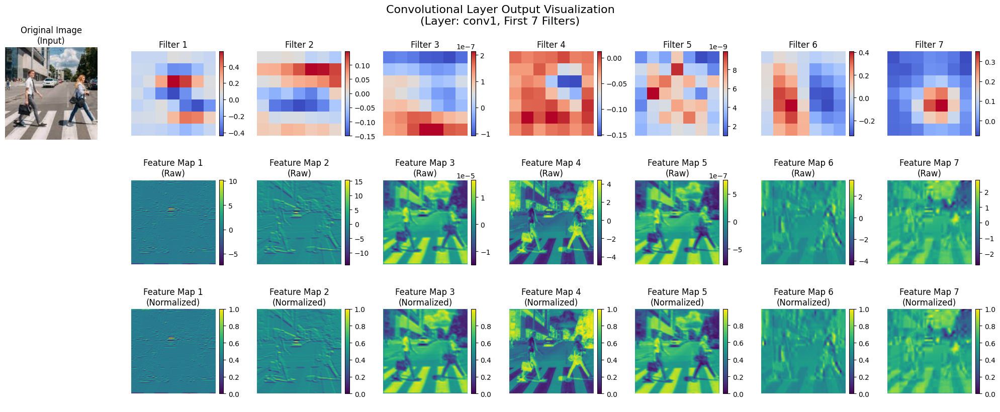


=== Detailed Convolution Process ===


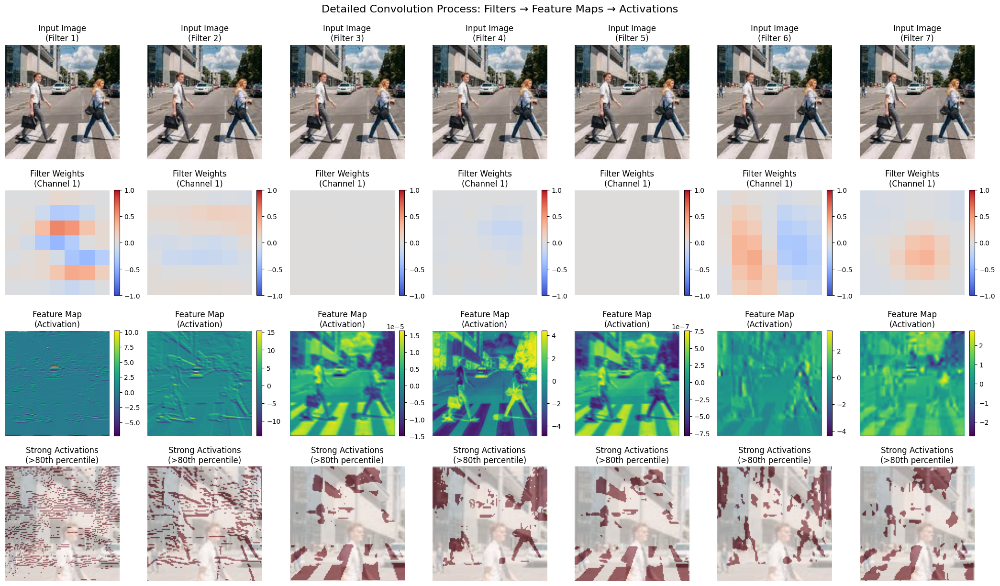


=== Filter Pattern Analysis ===
Analyzing 7 filters...
Filter 1: Mean=-0.001, Std=0.217, Range=1.364
  Pattern type: Edge detector (zero-centered, high variance)
Filter 2: Mean=-0.002, Std=0.112, Range=0.609
  Pattern type: Complex pattern
Filter 3: Mean=0.000, Std=0.000, Range=0.000
  Pattern type: Low variance - possibly blur/smooth
Filter 4: Mean=-0.015, Std=0.043, Range=0.248
  Pattern type: Low variance - possibly blur/smooth
Filter 5: Mean=0.000, Std=0.000, Range=0.000
  Pattern type: Low variance - possibly blur/smooth
Filter 6: Mean=-0.003, Std=0.148, Range=0.744
  Pattern type: Complex pattern
Filter 7: Mean=0.003, Std=0.166, Range=0.926
  Pattern type: Complex pattern

=== Comparing Different Filter Types ===

=== Filter Type Comparison ===
Edge detectors (high variance): [25, 1, 40]
Bright feature detectors (high mean): [62, 22, 18]
Dark feature detectors (low mean): [20, 59, 63]


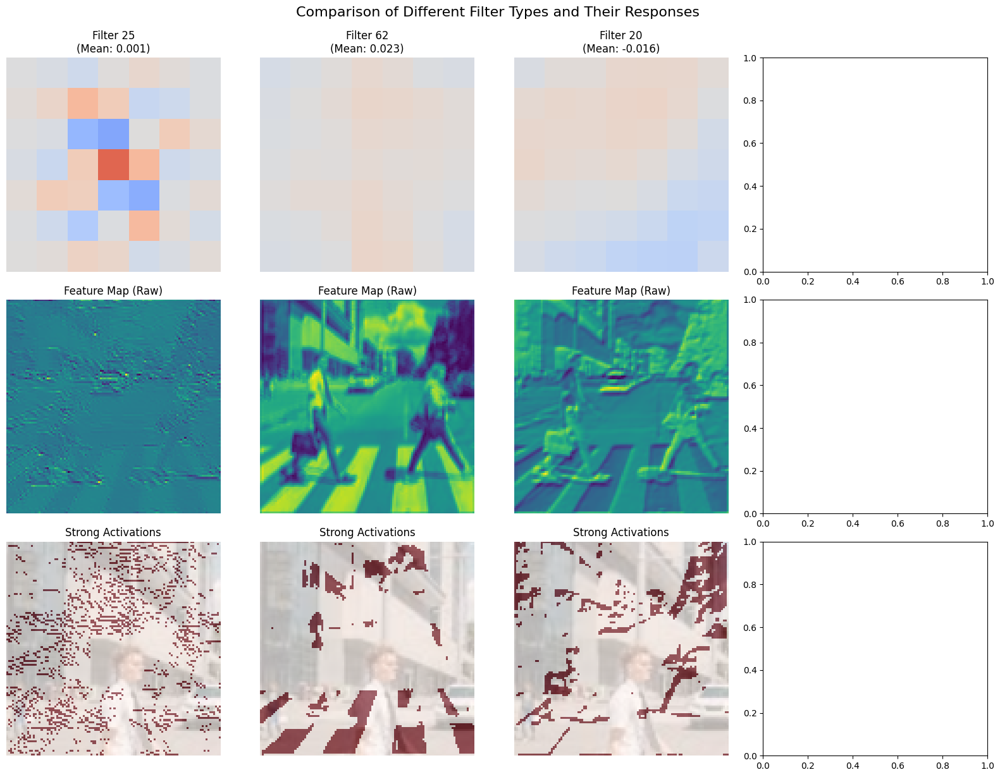

In [ ]:
# ===== Single Image Inference with Conv Output Visualization =====
import torch
from torch import nn
from torchvision import transforms
from torchvision.models import resnet18
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

BEST_PATH = "/content/drive/MyDrive/AAI3001/Project/models/best_resnet18_pedestrian.pt"

# 1) Recreate model + load weights
checkpoint = torch.load(BEST_PATH, map_location=DEVICE)

model = resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(checkpoint["model"])
model = model.to(DEVICE).eval()

# 2) Class names (from checkpoint, fallback if absent)
CLASS_NAMES = checkpoint.get("class_names", ["no pedestrian", "pedestrian"])

# 3) Validation transforms (match what you used for eval)
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225)),
])

def load_image(path):
    im = Image.open(path).convert("RGB")
    return val_tfms(im).unsqueeze(0)  # BCHW

@torch.no_grad()
def predict_image(image_path, threshold=0.50, use_tta=True):
    x = load_image(image_path).to(DEVICE)

    if use_tta:
        # simple TTA: original + horizontal flip
        logits = model(x)
        logits += model(torch.flip(x, dims=[3]))
        logits /= 2.0
    else:
        logits = model(x)

    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    pred_idx = int(np.argmax(probs))
    pred_name = CLASS_NAMES[pred_idx]
    ped_prob = float(probs[CLASS_NAMES.index("pedestrian")])

    # Thresholded decision for pedestrian (class 1)
    is_pedestrian = ped_prob > threshold

    print(f"Image: {image_path}")
    print(f"Predicted: {pred_name}  |  P(no pedestrian)={probs[0]:.3f}, P(pedestrian)={probs[1]:.3f}")
    print(f"Decision @ τ={threshold:.2f}: {'pedestrian' if is_pedestrian else 'no pedestrian'}")

    # Return both the processed tensor and the prediction results
    return x, probs, pred_idx

def denormalize(tensor):
    """Reverse the normalization for visualization"""
    if tensor.dim() == 4:  # batch dimension
        tensor = tensor.squeeze(0)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    tensor = tensor * std + mean  # unnormalize
    tensor = torch.clamp(tensor, 0, 1)
    return tensor

def visualize_conv_outputs(model, sample_images, num_filters=7, layer_name='conv1'):
    """
    Visualize the output of convolutional layers by applying filters to input images
    """
    # Set model to evaluation mode
    model.eval()

    # Get the convolutional layer
    if hasattr(model, layer_name):
        conv_layer = getattr(model, layer_name)
    else:
        print(f"Layer {layer_name} not found in model")
        return

    # Get the weights (filters) from the convolutional layer
    filters = conv_layer.weight.data.cpu().numpy()
    print(f"Filter shape: {filters.shape}")

    # Take only the first 'num_filters'
    filters = filters[:num_filters]

    # Convert sample images to numpy and denormalize for display
    sample_images_np = []
    for img in sample_images:
        img_np = denormalize(img)  # Use your existing denormalize function
        sample_images_np.append(img_np)

    # Create a figure for visualization
    n_samples = len(sample_images)
    fig, axes = plt.subplots(n_samples, num_filters + 1, figsize=(20, n_samples * 3))

    # Handle single sample case
    if n_samples == 1:
        axes = axes.reshape(1, -1)

    for sample_idx, (original_img, img_np) in enumerate(zip(sample_images, sample_images_np)):
        # Convert image to tensor format (C, H, W) and add batch dimension
        img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).unsqueeze(0).float()

        # Display original image
        axes[sample_idx, 0].imshow(img_np)
        axes[sample_idx, 0].set_title('Original Image')
        axes[sample_idx, 0].axis('off')

        # Apply each filter and display the feature map
        for filter_idx in range(num_filters):
            # Get the current filter
            filter_tensor = torch.from_numpy(filters[filter_idx]).unsqueeze(0).float()

            # Apply convolution (manually)
            with torch.no_grad():
                # Use appropriate padding to maintain size
                padding = conv_layer.padding[0] if isinstance(conv_layer.padding, tuple) else conv_layer.padding
                stride = conv_layer.stride[0] if isinstance(conv_layer.stride, tuple) else conv_layer.stride

                # Apply 2D convolution
                feature_map = torch.nn.functional.conv2d(
                    img_tensor,
                    filter_tensor,
                    padding=padding,
                    stride=stride
                )

                # Remove batch dimension and convert to numpy
                feature_map_np = feature_map.squeeze(0).squeeze(0).numpy()

            # Display feature map
            axes[sample_idx, filter_idx + 1].imshow(feature_map_np, cmap='viridis')
            axes[sample_idx, filter_idx + 1].set_title(f'Filter {filter_idx + 1}\nOutput')
            axes[sample_idx, filter_idx + 1].axis('off')

    plt.tight_layout()
    plt.suptitle(f'Convolutional Outputs from {layer_name}', fontsize=16, y=1.02)
    plt.show()

def visualize_detailed_conv_outputs(model, sample_images, num_filters=7, layer_name='conv1'):
    """
    More detailed visualization showing filters and their outputs side by side
    """
    # Set model to evaluation mode
    model.eval()

    # Get the convolutional layer
    if hasattr(model, layer_name):
        conv_layer = getattr(model, layer_name)
    else:
        print(f"Layer {layer_name} not found in model")
        return

    # Get the weights (filters) from the convolutional layer
    filters = conv_layer.weight.data.cpu().numpy()
    print(f"Filter shape: {filters.shape}")

    # Take only the first 'num_filters'
    selected_filters = filters[:num_filters]

    # Get first sample image
    sample_img = sample_images[0]
    img_np = denormalize(sample_img)

    # Create a larger figure
    fig, axes = plt.subplots(3, num_filters, figsize=(num_filters * 3, 9))

    # Handle single filter case
    if num_filters == 1:
        axes = axes.reshape(3, 1)

    # Convert image to tensor format (C, H, W) and add batch dimension
    img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).unsqueeze(0).float()

    for filter_idx in range(num_filters):
        # Plot 1: The filter itself (first channel)
        filter_img = selected_filters[filter_idx, 0]  # First channel
        axes[0, filter_idx].imshow(filter_img, cmap='coolwarm')
        axes[0, filter_idx].set_title(f'Filter {filter_idx + 1}')
        axes[0, filter_idx].axis('off')

        # Plot 2: Original image with filter overlay concept (optional)
        axes[1, filter_idx].imshow(img_np)
        axes[1, filter_idx].set_title('Original Image')
        axes[1, filter_idx].axis('off')

        # Apply convolution
        filter_tensor = torch.from_numpy(selected_filters[filter_idx]).unsqueeze(0).float()

        with torch.no_grad():
            padding = conv_layer.padding[0] if isinstance(conv_layer.padding, tuple) else conv_layer.padding
            stride = conv_layer.stride[0] if isinstance(conv_layer.stride, tuple) else conv_layer.stride

            feature_map = torch.nn.functional.conv2d(
                img_tensor,
                filter_tensor,
                padding=padding,
                stride=stride
            )

            feature_map_np = feature_map.squeeze(0).squeeze(0).numpy()

        # Plot 3: Feature map (output of convolution)
        im = axes[2, filter_idx].imshow(feature_map_np, cmap='viridis')
        axes[2, filter_idx].set_title(f'Feature Map {filter_idx + 1}')
        axes[2, filter_idx].axis('off')

        # Add colorbar for feature map
        plt.colorbar(im, ax=axes[2, filter_idx], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.suptitle(f'Convolutional Layer Output Visualization ({layer_name})', fontsize=16, y=1.02)
    plt.show()

def visualize_convolution_process(model, sample_image, filter_indices=[0, 1, 2], layer_name='conv1'):
    """
    Visualize the convolution process step by step for specific filters
    """
    # Set model to evaluation mode
    model.eval()

    # Get the convolutional layer
    conv_layer = getattr(model, layer_name)
    filters = conv_layer.weight.data.cpu().numpy()

    # Prepare the sample image
    img_np = denormalize(sample_image)
    img_tensor = torch.from_numpy(img_np.transpose(2, 0, 1)).unsqueeze(0).float()

    # Create figure
    n_filters = len(filter_indices)
    fig, axes = plt.subplots(4, n_filters, figsize=(n_filters * 4, 12))

    if n_filters == 1:
        axes = axes.reshape(4, 1)

    for idx, filter_idx in enumerate(filter_indices):
        # Get the filter
        filter_data = filters[filter_idx]

        # Plot 1: Original image
        axes[0, idx].imshow(img_np)
        axes[0, idx].set_title(f'Original Image\n(Filter {filter_idx + 1})')
        axes[0, idx].axis('off')

        # Plot 2: The filter (all channels)
        # For RGB images, show each channel separately or average
        if filter_data.shape[0] == 3:  # RGB filter
            # Show each channel or average
            filter_avg = filter_data.mean(axis=0)
            im1 = axes[1, idx].imshow(filter_avg, cmap='coolwarm')
            axes[1, idx].set_title(f'Filter {filter_idx + 1}\n(Average across channels)')
        else:
            im1 = axes[1, idx].imshow(filter_data[0], cmap='coolwarm')
            axes[1, idx].set_title(f'Filter {filter_idx + 1}\n(First channel)')
        axes[1, idx].axis('off')
        plt.colorbar(im1, ax=axes[1, idx], fraction=0.046, pad=0.04)

        # Apply convolution
        filter_tensor = torch.from_numpy(filter_data).unsqueeze(0).float()

        with torch.no_grad():
            padding = conv_layer.padding[0] if isinstance(conv_layer.padding, tuple) else conv_layer.padding
            stride = conv_layer.stride[0] if isinstance(conv_layer.stride, tuple) else conv_layer.stride

            feature_map = torch.nn.functional.conv2d(
                img_tensor,
                filter_tensor,
                padding=padding,
                stride=stride
            )

            feature_map_np = feature_map.squeeze(0).squeeze(0).numpy()

        # Plot 3: Feature map (raw)
        im2 = axes[2, idx].imshow(feature_map_np, cmap='viridis')
        axes[2, idx].set_title(f'Feature Map\n(Raw output)')
        axes[2, idx].axis('off')
        plt.colorbar(im2, ax=axes[2, idx], fraction=0.046, pad=0.04)

        # Plot 4: Feature map (normalized for better visualization)
        feature_map_norm = (feature_map_np - feature_map_np.min()) / (feature_map_np.max() - feature_map_np.min() + 1e-8)
        im3 = axes[3, idx].imshow(feature_map_norm, cmap='viridis')
        axes[3, idx].set_title(f'Feature Map\n(Normalized)')
        axes[3, idx].axis('off')
        plt.colorbar(im3, ax=axes[3, idx], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.suptitle('Convolution Process Visualization', fontsize=16, y=1.02)
    plt.show()

    # Print some statistics
    print(f"Convolution layer parameters:")
    print(f"  - Input channels: {conv_layer.in_channels}")
    print(f"  - Output channels: {conv_layer.out_channels}")
    print(f"  - Kernel size: {conv_layer.kernel_size}")
    print(f"  - Stride: {conv_layer.stride}")
    print(f"  - Padding: {conv_layer.padding}")

# ===== Set your image path and run =====
IMAGE_PATH = "/content/608220c8-e8b7-4723-8507-6bf6e2d55bca.jpg"   # <-- put your file path here

print("=== Single Image Inference ===")
processed_image, probs, pred_idx = predict_image(IMAGE_PATH, threshold=0.50, use_tta=True)

print("\n=== Visualizing Original Image ===")
# Display the original processed image
original_display = denormalize(processed_image.squeeze(0)).cpu().permute(1, 2, 0).numpy()
plt.figure(figsize=(8, 8))
plt.imshow(original_display)
plt.title(f"Input Image\nPrediction: {CLASS_NAMES[pred_idx]} (Confidence: {probs[pred_idx]:.3f})")
plt.axis('off')
plt.show()

print("\n=== Visualizing Conv1 Outputs ===")
# Use the processed image for conv output visualization
visualize_conv_outputs(model, [processed_image.squeeze(0)], num_filters=7, layer_name='conv1')

print("\n=== Visualizing Detailed Conv1 Outputs ===")
visualize_detailed_conv_outputs(model, [processed_image.squeeze(0)], num_filters=7, layer_name='conv1')

print("\n=== Visualizing Convolution Process ===")
visualize_convolution_process(model, processed_image.squeeze(0), filter_indices=[0, 1, 2, 3], layer_name='conv1')

# Optional: Compare with different layers
print("\n=== Visualizing Layer1 Outputs ===")
try:
    visualize_conv_outputs(model, [processed_image.squeeze(0)], num_filters=5, layer_name='layer1')
except Exception as e:
    print(f"Could not visualize layer1: {e}")

print("\n=== Visualizing Layer2 Outputs ===")
try:
    visualize_conv_outputs(model, [processed_image.squeeze(0)], num_filters=5, layer_name='layer2')
except Exception as e:
    print(f"Could not visualize layer2: {e}")

=== Saliency via Occlusion Analysis ===
Based on Zeiler & Fergus, 'Visualizing and Understanding Convolutional Networks', ECCV 2014
Using image prediction as reference: pedestrian
Original prediction: pedestrian (confidence: 0.998)
True label: pedestrian
Performing occlusion with 32x32 mask, stride 16...
Progress: 50/169
Progress: 100/169
Progress: 150/169


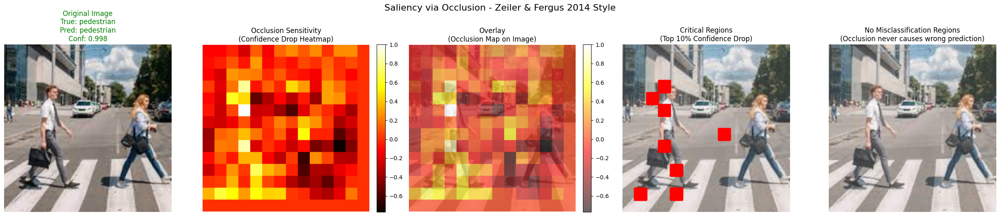


=== Occlusion Analysis Statistics ===
Maximum confidence drop: 0.001
Average confidence drop in top 10% regions: 0.001
Pixels causing misclassification: 0
Percentage of image that is critical: 4.1%

=== Comparing Different Mask Sizes ===

Processing with mask size 16x16, stride 8...
Original prediction: pedestrian (confidence: 0.998)
True label: pedestrian
Performing occlusion with 16x16 mask, stride 8...
Progress: 50/729
Progress: 100/729
Progress: 150/729
Progress: 200/729
Progress: 250/729
Progress: 300/729
Progress: 350/729
Progress: 400/729
Progress: 450/729
Progress: 500/729
Progress: 550/729
Progress: 600/729
Progress: 650/729
Progress: 700/729

Processing with mask size 32x32, stride 16...
Original prediction: pedestrian (confidence: 0.998)
True label: pedestrian
Performing occlusion with 32x32 mask, stride 16...
Progress: 50/169
Progress: 100/169
Progress: 150/169

Processing with mask size 48x48, stride 24...
Original prediction: pedestrian (confidence: 0.998)
True label: pe

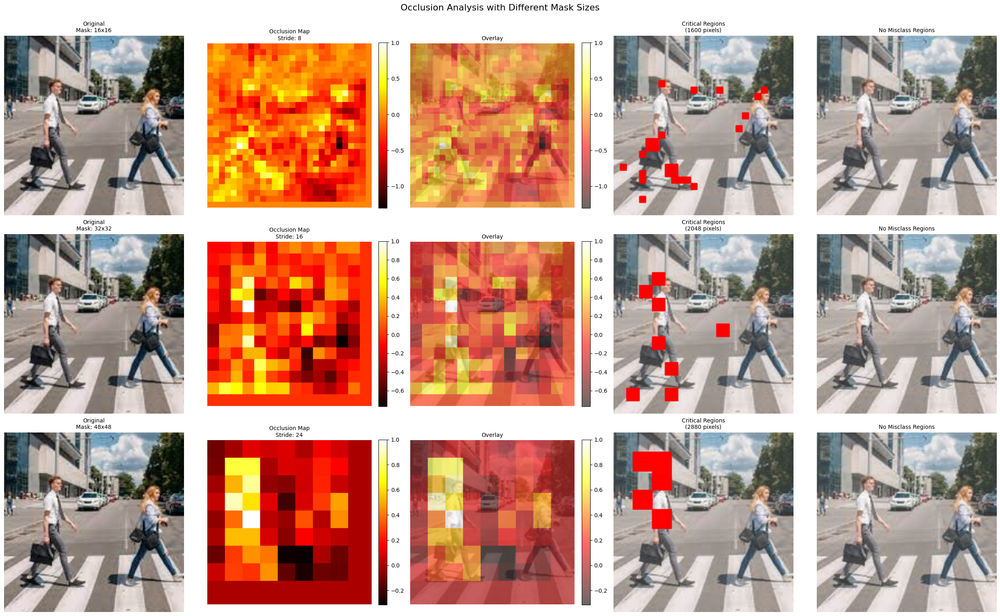


=== Identifying Most Important Regions ===


/tmp/ipython-input-2017066743.py:280: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


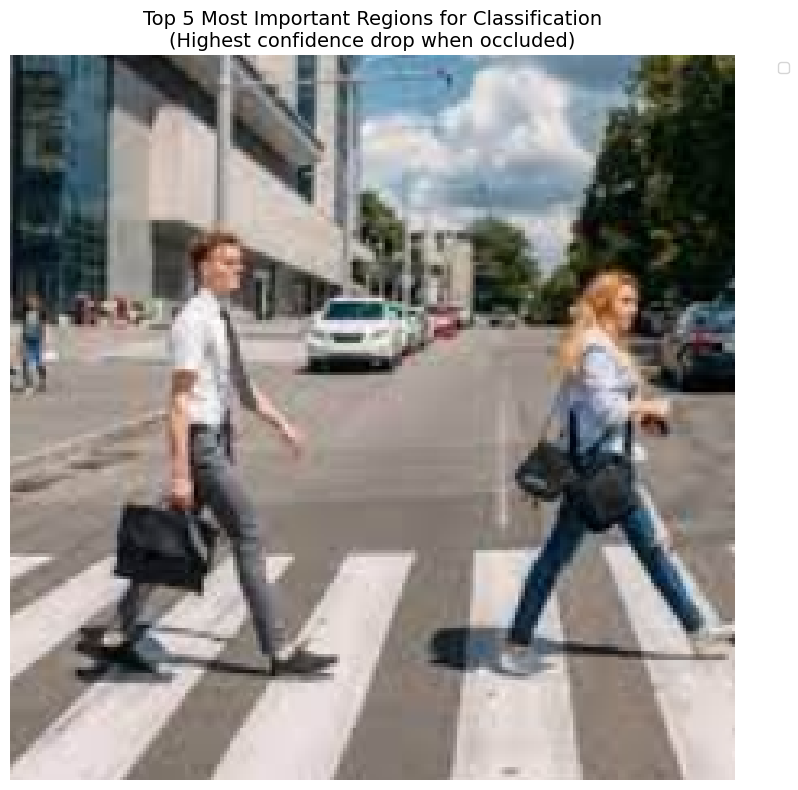


=== Top 5 Most Important Regions ===

=== Testing the Most Critical Region ===


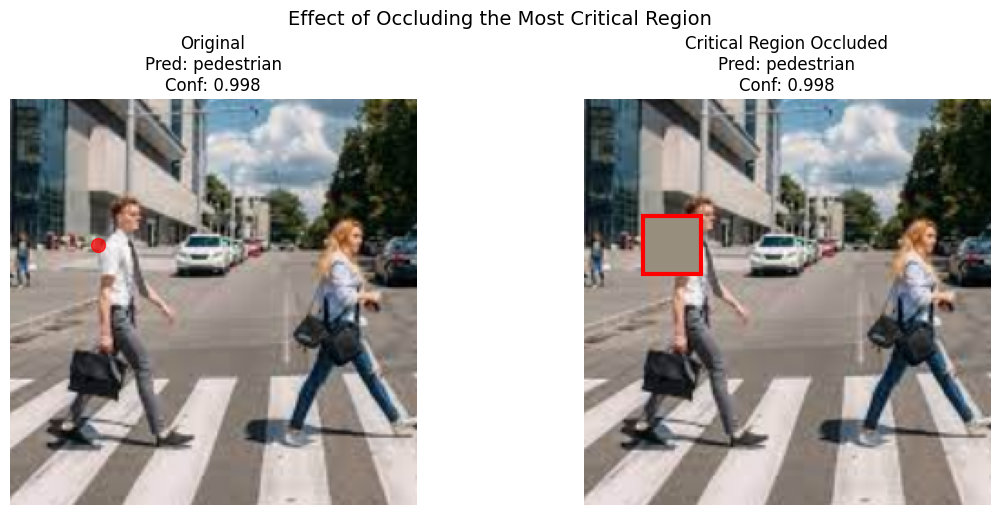


=== Critical Region Occlusion Test ===
Original prediction: pedestrian (confidence: 0.998)
With critical region occluded: pedestrian (confidence: 0.998)
Confidence drop: 0.001
Occluding this region reduces confidence but doesn't cause misclassification


In [ ]:
def saliency_via_occlusion_single(model, image, true_label, class_names, mask_size=32, stride=16):
    """
    Perform saliency analysis via occlusion for a single image
    """
    model.eval()

    # Move image to device and ensure it has batch dimension
    original_image = image.to(DEVICE)
    if original_image.dim() == 3:
        original_image = original_image.unsqueeze(0)

    true_label = torch.tensor([true_label]).to(DEVICE)

    # Get original prediction
    with torch.no_grad():
        original_output = model(original_image)
        original_prob = torch.softmax(original_output, dim=1)
        original_pred = original_output.argmax(dim=1).item()
        original_confidence = original_prob[0, original_pred].item()

    print(f"Original prediction: {class_names[original_pred]} (confidence: {original_confidence:.3f})")
    print(f"True label: {class_names[true_label.item()]}")

    # Get image dimensions
    _, C, H, W = original_image.shape

    # Create occlusion maps
    occlusion_map = torch.zeros((H, W)).to(DEVICE)
    confidence_change_map = torch.zeros((H, W)).to(DEVICE)
    misclassification_map = torch.zeros((H, W)).to(DEVICE)

    total_iterations = ((H - mask_size) // stride + 1) * ((W - mask_size) // stride + 1)
    current_iteration = 0

    print(f"Performing occlusion with {mask_size}x{mask_size} mask, stride {stride}...")

    # Slide mask over the image
    for i in range(0, H - mask_size + 1, stride):
        for j in range(0, W - mask_size + 1, stride):
            current_iteration += 1
            if current_iteration % 50 == 0:
                print(f"Progress: {current_iteration}/{total_iterations}")

            # Create masked image (set region to mean values)
            masked_image = original_image.clone()

            # Apply mask - set the region to the mean pixel value (better than zeros)
            mean_val = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(DEVICE)
            masked_image[0, :, i:i+mask_size, j:j+mask_size] = mean_val

            # Get prediction with mask
            with torch.no_grad():
                masked_output = model(masked_image)
                masked_prob = torch.softmax(masked_output, dim=1)
                masked_pred = masked_output.argmax(dim=1).item()
                masked_confidence = masked_prob[0, original_pred].item()

            # Calculate confidence drop
            confidence_drop = original_confidence - masked_confidence

            # Update occlusion maps
            occlusion_map[i:i+stride, j:j+stride] += confidence_drop
            confidence_change_map[i:i+stride, j:j+stride] = confidence_drop

            # Check if occlusion causes misclassification
            if masked_pred != original_pred:
                misclassification_map[i:i+stride, j:j+stride] += 1

    # Normalize occlusion map
    if occlusion_map.max() > 0:
        occlusion_map = occlusion_map / occlusion_map.max()

    return {
        'image': image.cpu(),
        'true_label': true_label.item(),
        'original_pred': original_pred,
        'original_confidence': original_confidence,
        'occlusion_map': occlusion_map.cpu(),
        'confidence_change_map': confidence_change_map.cpu(),
        'misclassification_map': misclassification_map.cpu()
    }

def visualize_occlusion_results_zeiler_fergus(result, class_names):
    """
    Visualize occlusion results in the style of Zeiler & Fergus 2014
    """
    image = denormalize(result['image'].squeeze(0)).permute(1, 2, 0).numpy()
    occlusion_map = result['occlusion_map'].numpy()
    confidence_change_map = result['confidence_change_map'].numpy()
    misclassification_map = result['misclassification_map'].numpy()

    true_label = result['true_label']
    pred_label = result['original_pred']
    confidence = result['original_confidence']

    # Create the 5-column visualization
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))

    # Column 1: Original image with prediction
    axes[0].imshow(image)
    axes[0].set_title(f'Original Image\nTrue: {class_names[true_label]}\nPred: {class_names[pred_label]}\nConf: {confidence:.3f}',
                     color='green' if true_label == pred_label else 'red',
                     fontsize=12)
    axes[0].axis('off')

    # Column 2: Occlusion heatmap
    im1 = axes[1].imshow(occlusion_map, cmap='hot')
    axes[1].set_title('Occlusion Sensitivity\n(Confidence Drop Heatmap)',
                     fontsize=12)
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # Column 3: Overlay of occlusion map
    axes[2].imshow(image, alpha=0.7)
    im2 = axes[2].imshow(occlusion_map, cmap='hot', alpha=0.6)
    axes[2].set_title('Overlay\n(Occlusion Map on Image)',
                     fontsize=12)
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    # Column 4: Regions causing maximum confidence drop (critical regions)
    # Find top 10% regions with highest confidence drop
    if confidence_change_map.max() > 0:
        threshold = np.percentile(confidence_change_map[confidence_change_map > 0], 90)
        critical_regions = confidence_change_map >= threshold
    else:
        critical_regions = np.zeros_like(confidence_change_map, dtype=bool)

    axes[3].imshow(image, alpha=0.8)
    # Create contour for critical regions
    if critical_regions.any():
        y_coords, x_coords = np.where(critical_regions)
        axes[3].scatter(x_coords, y_coords, c='red', s=10, alpha=0.6)
    axes[3].set_title('Critical Regions\n(Top 10% Confidence Drop)',
                     fontsize=12)
    axes[3].axis('off')

    # Column 5: Misclassification regions
    axes[4].imshow(image, alpha=0.8)
    if misclassification_map.max() > 0:
        misclassification_regions = misclassification_map > 0
        y_coords, x_coords = np.where(misclassification_regions)
        axes[4].scatter(x_coords, y_coords, c='blue', s=10, alpha=0.6)
        axes[4].set_title(f'Misclassification Regions\n({np.sum(misclassification_regions)} pixels cause wrong prediction)',
                         fontsize=12)
    else:
        axes[4].set_title('No Misclassification Regions\n(Occlusion never causes wrong prediction)',
                         fontsize=12)
    axes[4].axis('off')

    plt.tight_layout()
    plt.suptitle('Saliency via Occlusion - Zeiler & Fergus 2014 Style', fontsize=16, y=1.05)
    plt.show()

    # Print statistics
    print(f"\n=== Occlusion Analysis Statistics ===")
    print(f"Maximum confidence drop: {confidence_change_map.max():.3f}")
    print(f"Average confidence drop in top 10% regions: {np.mean(confidence_change_map[critical_regions]):.3f}")
    print(f"Pixels causing misclassification: {np.sum(misclassification_map > 0)}")
    print(f"Percentage of image that is critical: {np.sum(critical_regions) / (image.shape[0] * image.shape[1]) * 100:.1f}%")

def occlusion_analysis_with_different_masks(model, image, true_label, class_names):
    """
    Compare occlusion results with different mask sizes
    """
    mask_sizes = [16, 32, 48]
    strides = [8, 16, 24]

    fig, axes = plt.subplots(len(mask_sizes), 5, figsize=(25, 15))

    for idx, (mask_size, stride) in enumerate(zip(mask_sizes, strides)):
        print(f"\nProcessing with mask size {mask_size}x{mask_size}, stride {stride}...")

        # Perform occlusion for this mask size
        result = saliency_via_occlusion_single(model, image, true_label, class_names, mask_size, stride)

        image_display = denormalize(result['image'].squeeze(0)).permute(1, 2, 0).numpy()
        occlusion_map = result['occlusion_map'].numpy()
        confidence_change_map = result['confidence_change_map'].numpy()
        misclassification_map = result['misclassification_map'].numpy()

        # Column 1: Original image
        axes[idx, 0].imshow(image_display)
        axes[idx, 0].set_title(f'Original\nMask: {mask_size}x{mask_size}', fontsize=10)
        axes[idx, 0].axis('off')

        # Column 2: Occlusion map
        im1 = axes[idx, 1].imshow(occlusion_map, cmap='hot')
        axes[idx, 1].set_title(f'Occlusion Map\nStride: {stride}', fontsize=10)
        axes[idx, 1].axis('off')
        plt.colorbar(im1, ax=axes[idx, 1], fraction=0.046, pad=0.04)

        # Column 3: Overlay
        axes[idx, 2].imshow(image_display, alpha=0.7)
        im2 = axes[idx, 2].imshow(occlusion_map, cmap='hot', alpha=0.6)
        axes[idx, 2].set_title('Overlay', fontsize=10)
        axes[idx, 2].axis('off')
        plt.colorbar(im2, ax=axes[idx, 2], fraction=0.046, pad=0.04)

        # Column 4: Critical regions (top 10% confidence drop)
        if confidence_change_map.max() > 0:
            threshold = np.percentile(confidence_change_map[confidence_change_map > 0], 90)
            critical_regions = confidence_change_map >= threshold
        else:
            critical_regions = np.zeros_like(confidence_change_map, dtype=bool)

        axes[idx, 3].imshow(image_display, alpha=0.8)
        if critical_regions.any():
            y_coords, x_coords = np.where(critical_regions)
            axes[idx, 3].scatter(x_coords, y_coords, c='red', s=5, alpha=0.6)
        axes[idx, 3].set_title(f'Critical Regions\n({np.sum(critical_regions)} pixels)', fontsize=10)
        axes[idx, 3].axis('off')

        # Column 5: Misclassification regions
        axes[idx, 4].imshow(image_display, alpha=0.8)
        if misclassification_map.max() > 0:
            misclassification_regions = misclassification_map > 0
            y_coords, x_coords = np.where(misclassification_regions)
            axes[idx, 4].scatter(x_coords, y_coords, c='blue', s=5, alpha=0.6)
            axes[idx, 4].set_title(f'Misclass Regions\n({np.sum(misclassification_regions)} pixels)', fontsize=10)
        else:
            axes[idx, 4].set_title('No Misclass Regions', fontsize=10)
        axes[idx, 4].axis('off')

    plt.tight_layout()
    plt.suptitle('Occlusion Analysis with Different Mask Sizes', fontsize=16, y=1.02)
    plt.show()

def identify_most_important_regions(result, class_names, top_k=5):
    """
    Identify and visualize the most important regions for classification
    """
    confidence_change_map = result['confidence_change_map'].numpy()

    # Find local maxima in the confidence change map
    from scipy import ndimage

    # Apply Gaussian filter to smooth the map
    smoothed_map = ndimage.gaussian_filter(confidence_change_map, sigma=2)

    # Find local maxima
    neighborhood_size = 20
    data_max = ndimage.maximum_filter(smoothed_map, neighborhood_size)
    maxima = (smoothed_map == data_max)
    data_min = ndimage.minimum_filter(smoothed_map, neighborhood_size)
    diff = ((data_max - data_min) > 0.01)  # Minimum difference threshold
    maxima[diff == 0] = 0

    labeled, num_objects = ndimage.label(maxima)
    slices = ndimage.find_objects(labeled)

    # Get the top K regions by confidence drop
    regions = []
    for dy, dx in slices:
        y_center = (dy.start + dy.stop) // 2
        x_center = (dx.start + dx.stop) // 2
        confidence_drop = smoothed_map[y_center, x_center]
        regions.append((x_center, y_center, confidence_drop))

    # Sort by confidence drop and take top K
    regions.sort(key=lambda x: x[2], reverse=True)
    top_regions = regions[:top_k]

    # Visualize
    image = denormalize(result['image'].squeeze(0)).permute(1, 2, 0).numpy()

    plt.figure(figsize=(12, 8))
    plt.imshow(image)

    # Plot the top regions
    colors = ['red', 'blue', 'green', 'orange', 'purple']
    for i, (x, y, conf_drop) in enumerate(top_regions):
        plt.scatter(x, y, c=colors[i % len(colors)], s=200, alpha=0.7,
                   label=f'Region {i+1}: Δconf={conf_drop:.3f}')
        plt.text(x, y-20, f'{i+1}', fontsize=12, ha='center', va='center',
                color='white', weight='bold', bbox=dict(boxstyle="circle,pad=0.3", facecolor=colors[i % len(colors)]))

    plt.title(f'Top {top_k} Most Important Regions for Classification\n(Highest confidence drop when occluded)',
              fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    print(f"\n=== Top {top_k} Most Important Regions ===")
    for i, (x, y, conf_drop) in enumerate(top_regions):
        print(f"Region {i+1}: Position ({x}, {y}), Confidence Drop: {conf_drop:.3f}")

# ===== Run the occlusion analysis on your image =====
print("=== Saliency via Occlusion Analysis ===")
print("Based on Zeiler & Fergus, 'Visualizing and Understanding Convolutional Networks', ECCV 2014")

# We need to get the true label for our test image
# Since we're using a single image, let's assume we want to see what happens
# For demonstration, we'll use the predicted label as the "true" label
with torch.no_grad():
    test_output = model(processed_image)
    test_pred = test_output.argmax(dim=1).item()

print(f"Using image prediction as reference: {CLASS_NAMES[test_pred]}")

# Perform occlusion analysis
result = saliency_via_occlusion_single(model, processed_image.squeeze(0), test_pred, CLASS_NAMES)

# Visualize in Zeiler & Fergus style
visualize_occlusion_results_zeiler_fergus(result, CLASS_NAMES)

# Compare different mask sizes
print("\n=== Comparing Different Mask Sizes ===")
occlusion_analysis_with_different_masks(model, processed_image.squeeze(0), test_pred, CLASS_NAMES)

# Identify most important regions
print("\n=== Identifying Most Important Regions ===")
identify_most_important_regions(result, CLASS_NAMES, top_k=5)

# Additional analysis: What happens when we occlude the most important region?
def test_critical_region_occlusion(model, image, critical_region, class_names):
    """
    Test what happens when we occlude the most critical region
    """
    model.eval()

    image_tensor = image.to(DEVICE)
    if image_tensor.dim() == 3:
        image_tensor = image_tensor.unsqueeze(0)

    # Get original prediction
    with torch.no_grad():
        original_output = model(image_tensor)
        original_prob = torch.softmax(original_output, dim=1)
        original_pred = original_output.argmax(dim=1).item()
        original_confidence = original_prob[0, original_pred].item()

    # Occlude the critical region
    x, y, _ = critical_region
    mask_size = 32

    masked_image = image_tensor.clone()
    mean_val = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(DEVICE)

    # Calculate occlusion bounds
    h_start = max(0, y - mask_size//2)
    h_end = min(image_tensor.shape[2], y + mask_size//2)
    w_start = max(0, x - mask_size//2)
    w_end = min(image_tensor.shape[3], x + mask_size//2)

    masked_image[0, :, h_start:h_end, w_start:w_end] = mean_val

    # Get prediction with critical region occluded
    with torch.no_grad():
        masked_output = model(masked_image)
        masked_prob = torch.softmax(masked_output, dim=1)
        masked_pred = masked_output.argmax(dim=1).item()
        masked_confidence = masked_prob[0, original_pred].item()

    # Visualize
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original
    original_display = denormalize(image_tensor.squeeze(0)).cpu().permute(1, 2, 0).numpy()
    axes[0].imshow(original_display)
    axes[0].scatter(x, y, c='red', s=100, alpha=0.7)
    axes[0].set_title(f'Original\nPred: {class_names[original_pred]}\nConf: {original_confidence:.3f}')
    axes[0].axis('off')

    # With critical region occluded
    masked_display = denormalize(masked_image.squeeze(0)).cpu().permute(1, 2, 0).numpy()
    axes[1].imshow(masked_display)
    axes[1].add_patch(plt.Rectangle((w_start, h_start), w_end-w_start, h_end-h_start,
                                  fill=False, edgecolor='red', linewidth=3))
    axes[1].set_title(f'Critical Region Occluded\nPred: {class_names[masked_pred]}\nConf: {masked_confidence:.3f}')
    axes[1].axis('off')

    plt.tight_layout()
    plt.suptitle('Effect of Occluding the Most Critical Region', fontsize=14, y=1.02)
    plt.show()

    print(f"\n=== Critical Region Occlusion Test ===")
    print(f"Original prediction: {class_names[original_pred]} (confidence: {original_confidence:.3f})")
    print(f"With critical region occluded: {class_names[masked_pred]} (confidence: {masked_confidence:.3f})")
    print(f"Confidence drop: {original_confidence - masked_confidence:.3f}")

    if original_pred != masked_pred:
        print("🚨 CRITICAL: Occluding this region causes misclassification!")
    else:
        print("Occluding this region reduces confidence but doesn't cause misclassification")

# Test the most critical region
if 'confidence_change_map' in result:
    confidence_change_map = result['confidence_change_map'].numpy()
    max_idx = np.unravel_index(np.argmax(confidence_change_map), confidence_change_map.shape)
    most_critical_region = (max_idx[1], max_idx[0], confidence_change_map[max_idx])

    print("\n=== Testing the Most Critical Region ===")
    test_critical_region_occlusion(model, processed_image.squeeze(0), most_critical_region, CLASS_NAMES)